## 1. Loading packages

In [38]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

import spacy

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams

from sklearn.model_selection import KFold

In [39]:
# Set the font family to Times New Roman
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']
matplotlib.rcParams.update({'font.size': 16})

## 2. Loading data

In [25]:
df = pd.read_csv('updated_dataset.csv')

## 3. Prepare stopwords

In [26]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

## 4. Convert to list

In [27]:
data = df.processed_review.values.tolist()

## 5. Removing URLs & new line characters & airline names

In [28]:
data

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

In [29]:
data = [re.sub(r'http\S+', '', sent) for sent in data]
data = [re.sub('\s+', ' ', sent) for sent in data]

print(data[:1])

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

## 6. Tokenize & clean-up text

In [30]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast', 'track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'understand', 'othe

## 7. Creating bigram & trigrams

In [31]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# Original threshold
print("Original threshold:")
print(bigram_mod[data_words[0]])

# Adjusted threshold
adjusted_bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)  # Adjusted threshold
adjusted_bigram_mod = gensim.models.phrases.Phraser(adjusted_bigram)
print("Adjusted threshold:")
print(adjusted_bigram_mod[data_words[0]])

Original threshold:
['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast_track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'un

## 8. Remove stopwords, make bigrams and lemmatization

In [32]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [33]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

nlp = spacy.load("en_core_web_sm")

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

for doc in data_words_bigrams:
    print(doc)

[['use', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organise', 'quickly', 'seat', 'business', 'class', 'typically', 'middle', 'seat', 'block', 'departed', 'time', 'air', 'lunch', 'serve', 'fine', 'crew', 'good', 'extra', 'drink', 'serve', 'arrive', 'time', 'hour', 'wait', 'min', 'bag', 'return', 'economy', 'check', 'quick', 'security', 'use', 'lounge', 'ff', 'status', 'boarding', 'quick', 'flight', 'depart', 'minute', 'late', 'crew', 'fine', 'seat', 'tap', 'many', 'airline', 'serve', 'economy', 'even', 'water', 'understand', 'otherwise', 'trip', 'good', 'use', 'tap', 'flight', 'previous', 'month', 'hesitate', 'use', 'let', 'check', 'experience', 'speak', 'actually', 'look', 'fall', 'bed', 'sum', 'dreadful', 'airport']]
['used', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'fast_track', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organised', 'quickly', 'seats', 'busi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## 9. Create dictionary and corpus

In [34]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 3), (11, 1), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 2), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 3), (26, 2), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 3), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 3), (47, 1), (48, 1), (49, 3), (50, 2), (51, 3), (52, 1), (53, 1), (54, 1), (55, 3), (56, 2), (57, 1), (58, 1), (59, 1), (60, 4), (61, 1), (62, 1)]]


In [35]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('actually', 1),
  ('air', 1),
  ('airline', 1),
  ('airport', 1),
  ('arrive', 1),
  ('bag', 1),
  ('bed', 1),
  ('block', 1),
  ('boarding', 2),
  ('business', 1),
  ('check', 3),
  ('class', 1),
  ('crew', 2),
  ('depart', 1),
  ('departed', 1),
  ('direct', 1),
  ('dreadful', 1),
  ('drink', 1),
  ('economy', 2),
  ('even', 1),
  ('experience', 1),
  ('extra', 1),
  ('fall', 1),
  ('ff', 1),
  ('fine', 2),
  ('flight', 3),
  ('good', 2),
  ('heathrow', 1),
  ('hesitate', 1),
  ('hour', 1),
  ('late', 1),
  ('let', 1),
  ('lgw', 1),
  ('look', 1),
  ('lounge', 3),
  ('lunch', 1),
  ('many', 1),
  ('middle', 1),
  ('min', 1),
  ('minute', 1),
  ('month', 1),
  ('okay', 1),
  ('organise', 1),
  ('otherwise', 1),
  ('pretty', 1),
  ('previous', 1),
  ('quick', 3),
  ('quickly', 1),
  ('return', 1),
  ('seat', 3),
  ('security', 2),
  ('serve', 3),
  ('speak', 1),
  ('status', 1),
  ('sum', 1),
  ('tap', 3),
  ('time', 2),
  ('trip', 1),
  ('typically', 1),
  ('understand', 1),
  ('us

## 10. Build base model

In [36]:
base_lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=8, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=500,
                                           passes=10,
                                           alpha='symmetric',
                                           eta = 'symmetric',
                                           per_word_topics=True)

## 11. View the base model

In [37]:
pprint(base_lda_model.print_topics())
doc_lda = base_lda_model[corpus]

[(0,
  '0.149*"reykjavik" + 0.136*"iceland" + 0.087*"suitcase" + 0.018*"local" + '
  '0.016*"coach" + 0.015*"ist" + 0.013*"trolley" + 0.013*"pretzel" + '
  '0.012*"web" + 0.011*"hall"'),
 (1,
  '0.120*"seat" + 0.070*"icelandair" + 0.042*"vuele" + 0.023*"economy" + '
  '0.018*"class" + 0.016*"business" + 0.015*"row" + 0.014*"saga" + '
  '0.013*"premium" + 0.012*"fly"'),
 (2,
  '0.085*"flight" + 0.038*"hour" + 0.024*"delay" + 0.018*"day" + '
  '0.017*"airline" + 0.017*"get" + 0.015*"time" + 0.014*"cancel" + 0.012*"fly" '
  '+ 0.011*"airport"'),
 (3,
  '0.060*"flight" + 0.026*"good" + 0.024*"time" + 0.018*"crew" + 0.016*"fly" + '
  '0.013*"service" + 0.013*"cabin" + 0.011*"friendly" + 0.010*"well" + '
  '0.010*"nice"'),
 (4,
  '0.026*"check" + 0.020*"boarding" + 0.019*"plane" + 0.019*"passenger" + '
  '0.017*"gate" + 0.017*"staff" + 0.016*"go" + 0.014*"flight" + 0.013*"get" + '
  '0.012*"take"'),
 (5,
  '0.045*"pay" + 0.035*"airline" + 0.028*"check" + 0.026*"fly" + '
  '0.020*"ticket" + 0

## 12. Compute model perplexity and coherence score

In [38]:
# Compute Perplexity
print('\nPerplexity of base model: ', base_lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=base_lda_model, texts=data_lemmatized, dictionary=id2word, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score of base model: ', coherence_lda)


Perplexity of base model:  -7.072300718639658

Coherence Score of base model:  -3.2014317288220324


In [28]:
# Create Document - Topic Matrix
document_topics = [base_lda_model.get_document_topics(doc) for doc in corpus]

# Determine the maximum number of topics across all documents
max_topics = max(len(doc_topics) for doc_topics in document_topics)

# Pad the topic probabilities with zeros for consistent length
padded_lda_output = [[topic_prob[1] for topic_prob in doc_topics] + [0.0] * (max_topics - len(doc_topics)) for doc_topics in document_topics]

# Column names
topicnames = ["Topic" + str(i) for i in range(base_lda_model.num_topics)]

# Index names
docnames = ["Doc" + str(i) for i in range(len(data))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(padded_lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics


,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,dominant_topic
Doc0,0.000000,0.060000,0.000000,0.410000,0.220000,0.000000,0.000000,0.300000,3
Doc1,0.000000,0.000000,0.190000,0.060000,0.270000,0.000000,0.000000,0.470000,7
Doc2,0.000000,0.000000,0.180000,0.070000,0.000000,0.000000,0.740000,0.000000,6
Doc3,0.010000,0.010000,0.010000,0.390000,0.010000,0.010000,0.010000,0.570000,7
Doc4,0.000000,0.000000,0.520000,0.000000,0.170000,0.000000,0.280000,0.000000,2
Doc5,0.000000,0.000000,0.400000,0.200000,0.180000,0.060000,0.000000,0.150000,2
Doc6,0.010000,0.160000,0.010000,0.010000,0.010000,0.810000,0.010000,0.010000,5
Doc7,0.010000,0.000000,0.000000,0.000000,0.100000,0.280000,0.540000,0.060000,6
Doc8,0.000000,0.000000,0.610000,0.090000,0.000000,0.000000,0.240000,0.040000,2
Doc9,0.000000,0.170000,0.000000,0.090000,0.260000,0.000000,0.060000,0.400000,7


In [29]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,3,3393
1,2,2732
2,7,1941
3,4,1620
4,6,1487
5,5,1188
6,1,277


# Not removing stopwords

## 2. Loading data

In [2]:
df = pd.read_csv('updated_dataset.csv')

## 3. Prepare stopwords

In [5]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

## 4. Convert to list

In [3]:
data = df.processed_review.values.tolist()

## 5. Removing URLs & new line characters & airline names

In [7]:
data

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

In [4]:
data = [re.sub(r'http\S+', '', sent) for sent in data]
data = [re.sub('\s+', ' ', sent) for sent in data]

print(data[:1])

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

## 6. Tokenize & clean-up text

In [5]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast', 'track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'understand', 'othe

## 7. Creating bigram & trigrams

In [6]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# Original threshold
print("Original threshold:")
print(bigram_mod[data_words[0]])

# Adjusted threshold
adjusted_bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)  # Adjusted threshold
adjusted_bigram_mod = gensim.models.phrases.Phraser(adjusted_bigram)
print("Adjusted threshold:")
print(adjusted_bigram_mod[data_words[0]])

Original threshold:
['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast_track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'un

## 8. Remove stopwords, make bigrams and lemmatization

In [7]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
#def remove_stopwords(texts):
#    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [9]:
# Remove Stop Words
#data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words)

nlp = spacy.load("en_core_web_sm")

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

for doc in data_words_bigrams:
    print(doc)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['brussels', 'to', 'moscow', 'not', 'my', 'first', 'flight', 'with', 'aeroflot', 'and', 'each', 'time', 'surprised', 'by', 'star', 'onboard', 'service', 'very', 'polite', 'and', 'attentive', 'flight', 'attendants', 'always', 'an', 'extra', 'attention', 'for', 'passengers', 'with', 'kids', 'on', 'board', 'beverages', 'are', 'foreseen', 'for', 'all', 'class', 'passengers', 'even', 'on', 'very', 'short', 'flight', 'from', 'bru', 'to', 'svo', 'soft_drinks', 'and', 'juice', 'fresh', 'salad', 'scone', 'cheese', 'butter', 'bread', 'warm', 'and', 'very', 'tasty', 'meat', 'or', 'poultry', 'dish', 'side', 'dish', 'dessert', 'tea', 'or', 'coffee', 'all', 'is', 'tasty', 'en', 'fresh', 'this', 'is', 'just', 'to', 'compare', 'the', 'ticket', 'of', 'other', 'eu', 'companies', 'who', 'will', 'not', 'serve', 'you', 'anything', 'unless', 'higher', 'class', 'and', 'so', 'much', 'more', 'expensive', 'ticket', 'or', 'on', 'board', 'extra', 'purchases', 'for', 'snacks', 'and', 'not', 'full', 'meal', 'fleet

## 9. Create dictionary and corpus

In [10]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 2), (11, 1), (12, 3), (13, 1), (14, 2), (15, 2), (16, 1), (17, 1), (18, 1), (19, 2), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 2), (27, 3), (28, 2), (29, 1), (30, 1), (31, 1), (32, 2), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 3), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 3), (53, 1), (54, 1), (55, 3), (56, 2), (57, 3), (58, 1), (59, 1), (60, 1), (61, 1), (62, 3), (63, 2), (64, 1), (65, 1), (66, 1), (67, 4), (68, 1), (69, 1)]]


In [11]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('actually', 1),
  ('again', 1),
  ('agent', 1),
  ('air', 1),
  ('airline', 1),
  ('airport', 1),
  ('arrive', 1),
  ('bag', 1),
  ('bed', 1),
  ('block', 1),
  ('boarding', 2),
  ('business', 1),
  ('check', 3),
  ('class', 1),
  ('crew', 2),
  ('depart', 2),
  ('direct', 1),
  ('dreadful', 1),
  ('drink', 1),
  ('economy', 2),
  ('even', 1),
  ('experience', 1),
  ('extra', 1),
  ('fall', 1),
  ('fast_track', 1),
  ('ff', 1),
  ('fine', 2),
  ('flight', 3),
  ('good', 2),
  ('heathrow', 1),
  ('hesitate', 1),
  ('hour', 1),
  ('in', 2),
  ('just', 1),
  ('late', 1),
  ('let', 1),
  ('lgw', 1),
  ('look', 1),
  ('lounge', 3),
  ('lunch', 1),
  ('many', 1),
  ('middle', 1),
  ('min', 1),
  ('minute', 1),
  ('month', 1),
  ('okay', 1),
  ('once', 1),
  ('only', 1),
  ('organise', 1),
  ('otherwise', 1),
  ('pretty', 1),
  ('previous', 1),
  ('quick', 3),
  ('quickly', 1),
  ('return', 1),
  ('seat', 3),
  ('security', 2),
  ('serve', 3),
  ('so', 1),
  ('speak', 1),
  ('status', 1),


## 10. Build base model

In [12]:
base_lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=8, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=500,
                                           passes=10,
                                           alpha='symmetric',
                                           eta = 'symmetric',
                                           per_word_topics=True)

## 11. View the base model

In [13]:
pprint(base_lda_model.print_topics())
doc_lda = base_lda_model[corpus]

[(0,
  '0.046*"keflavik" + 0.033*"iceland" + 0.025*"crew" + 0.024*"ask" + '
  '0.018*"passenger" + 0.014*"cabin" + 0.013*"say" + 0.013*"attendant" + '
  '0.012*"virgin_atlantic" + 0.012*"turkish"'),
 (1,
  '0.043*"seat" + 0.031*"class" + 0.025*"business" + 0.021*"economy" + '
  '0.019*"vuele" + 0.017*"food" + 0.016*"meal" + 0.013*"have" + '
  '0.012*"service" + 0.011*"lounge"'),
 (2,
  '0.049*"flight" + 0.036*"very" + 0.029*"good" + 0.019*"time" + 0.018*"crew" '
  '+ 0.015*"cabin" + 0.013*"service" + 0.013*"food" + 0.012*"fly" + '
  '0.011*"friendly"'),
 (3,
  '0.059*"flight" + 0.031*"hour" + 0.022*"delay" + 0.019*"icelandair" + '
  '0.018*"have" + 0.016*"time" + 0.014*"get" + 0.014*"plane" + 0.011*"airport" '
  '+ 0.011*"wait"'),
 (4,
  '0.079*"airline" + 0.062*"service" + 0.045*"bad" + 0.044*"fly" + '
  '0.042*"customer" + 0.030*"experience" + 0.028*"never" + 0.023*"ever" + '
  '0.022*"swiss" + 0.017*"very"'),
 (5,
  '0.040*"luggage" + 0.030*"check" + 0.028*"have" + 0.028*"bag" + 0.0

## 12. Compute model perplexity and coherence score

In [14]:
# Compute Perplexity
print('\nPerplexity of base model: ', base_lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=base_lda_model, texts=data_lemmatized, dictionary=id2word, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score of base model: ', coherence_lda)


Perplexity of base model:  -7.063137193357516

Coherence Score of base model:  -1.7472024355614877


In [15]:
# Create Document - Topic Matrix
document_topics = [base_lda_model.get_document_topics(doc) for doc in corpus]

# Determine the maximum number of topics across all documents
max_topics = max(len(doc_topics) for doc_topics in document_topics)

# Pad the topic probabilities with zeros for consistent length
padded_lda_output = [[topic_prob[1] for topic_prob in doc_topics] + [0.0] * (max_topics - len(doc_topics)) for doc_topics in document_topics]

# Column names
topicnames = ["Topic" + str(i) for i in range(base_lda_model.num_topics)]

# Index names
docnames = ["Doc" + str(i) for i in range(len(data))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(padded_lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics


,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,dominant_topic
Doc0,0.230000,0.440000,0.240000,0.030000,0.060000,0.000000,0.000000,0.000000,1
Doc1,0.040000,0.420000,0.070000,0.330000,0.070000,0.040000,0.030000,0.000000,1
Doc2,0.020000,0.020000,0.040000,0.090000,0.050000,0.590000,0.190000,0.000000,5
Doc3,0.310000,0.660000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
Doc4,0.390000,0.540000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,1
Doc5,0.160000,0.640000,0.110000,0.080000,0.000000,0.000000,0.000000,0.000000,1
Doc6,0.260000,0.710000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
Doc7,0.040000,0.150000,0.180000,0.170000,0.310000,0.160000,0.000000,0.000000,4
Doc8,0.040000,0.060000,0.410000,0.490000,0.000000,0.000000,0.000000,0.000000,3
Doc9,0.330000,0.190000,0.300000,0.160000,0.000000,0.000000,0.000000,0.000000,0


In [16]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,1,4175
1,2,3295
2,0,1875
3,3,1699
4,4,964
5,5,454
6,6,144
7,7,32


# -----------------------------------------------------------------------------------------------------------

# Tuning: excluding airline names

## 1. Loading packages

In [31]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

import spacy

## 2. Loading data

In [32]:
df = pd.read_csv('updated_dataset.csv')

## 3. Prepare stopwords

In [33]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

## 4. Convert to list

In [34]:
data = df.processed_review.values.tolist()

## 5. Removing URLs & new line characters & airline names

In [35]:
data

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

In [36]:
data = [re.sub(r'http\S+', '', sent) for sent in data]
data = [re.sub('\s+', ' ', sent) for sent in data]

# List of company names to remove
company_names = ['tap portugal', 'easyjet', 'klm', 'lufthansa', 'ryanair', 
                 'british airways', 'air france', 'turkish airlines', 'norwegian', 
                 'sas', 'iberia', 'wizz air', 'ita airways', 'swiss international air lines', 
                 'aeroflot', 'virgin atlantic', 'finn air', 'brussels airlines', 'vueling airlines', 
                 'icelandair', 'vueling', 'wizz', 'swiss', 'turkish', 'finnair']

# Function to remove company names from a text
def remove_company_names(text):
    for company_name in company_names:
        text = re.sub(company_name, '', text, flags=re.IGNORECASE)
    return text

data = [remove_company_names(text) for text in data]

print(data[:1])

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

## 6. Tokenize & clean-up text

In [37]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast', 'track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'understand', 'othe

## 7. Creating bigram & trigrams

In [38]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# Original threshold
print("Original threshold:")
print(bigram_mod[data_words[0]])

# Adjusted threshold
adjusted_bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)  # Adjusted threshold
adjusted_bigram_mod = gensim.models.phrases.Phraser(adjusted_bigram)
print("Adjusted threshold:")
print(adjusted_bigram_mod[data_words[0]])

Original threshold:
['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast_track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'un

## 8. Remove stopwords, make bigrams and lemmatization

In [39]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [40]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

nlp = spacy.load("en_core_web_sm")

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

for doc in data_words_bigrams:
    print(doc)

[['use', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organise', 'quickly', 'seat', 'business', 'class', 'typically', 'middle', 'seat', 'block', 'departed', 'time', 'air', 'lunch', 'serve', 'fine', 'crew', 'good', 'extra', 'drink', 'serve', 'arrive', 'time', 'hour', 'wait', 'min', 'bag', 'return', 'economy', 'check', 'quick', 'security', 'use', 'lounge', 'ff', 'status', 'boarding', 'quick', 'flight', 'depart', 'minute', 'late', 'crew', 'fine', 'seat', 'tap', 'many', 'airline', 'serve', 'economy', 'even', 'water', 'understand', 'otherwise', 'trip', 'good', 'use', 'tap', 'flight', 'previous', 'month', 'hesitate', 'use', 'let', 'check', 'experience', 'speak', 'actually', 'look', 'fall', 'bed', 'sum', 'dreadful', 'airport']]
['used', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'fast_track', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organised', 'quickly', 'seats', 'busi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## 9. Create dictionary and corpus

In [41]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 3), (11, 1), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 2), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 3), (26, 2), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 3), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 3), (47, 1), (48, 1), (49, 3), (50, 2), (51, 3), (52, 1), (53, 1), (54, 1), (55, 3), (56, 2), (57, 1), (58, 1), (59, 1), (60, 4), (61, 1), (62, 1)]]


In [42]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('actually', 1),
  ('air', 1),
  ('airline', 1),
  ('airport', 1),
  ('arrive', 1),
  ('bag', 1),
  ('bed', 1),
  ('block', 1),
  ('boarding', 2),
  ('business', 1),
  ('check', 3),
  ('class', 1),
  ('crew', 2),
  ('depart', 1),
  ('departed', 1),
  ('direct', 1),
  ('dreadful', 1),
  ('drink', 1),
  ('economy', 2),
  ('even', 1),
  ('experience', 1),
  ('extra', 1),
  ('fall', 1),
  ('ff', 1),
  ('fine', 2),
  ('flight', 3),
  ('good', 2),
  ('heathrow', 1),
  ('hesitate', 1),
  ('hour', 1),
  ('late', 1),
  ('let', 1),
  ('lgw', 1),
  ('look', 1),
  ('lounge', 3),
  ('lunch', 1),
  ('many', 1),
  ('middle', 1),
  ('min', 1),
  ('minute', 1),
  ('month', 1),
  ('okay', 1),
  ('organise', 1),
  ('otherwise', 1),
  ('pretty', 1),
  ('previous', 1),
  ('quick', 3),
  ('quickly', 1),
  ('return', 1),
  ('seat', 3),
  ('security', 2),
  ('serve', 3),
  ('speak', 1),
  ('status', 1),
  ('sum', 1),
  ('tap', 3),
  ('time', 2),
  ('trip', 1),
  ('typically', 1),
  ('understand', 1),
  ('us

## 10. Build base model

In [44]:
base_lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=8, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=500,
                                           passes=10,
                                           alpha='symmetric',
                                           eta='symmetric',
                                           per_word_topics=True)

## 11. View the base model

In [47]:
for topic_id, topic_words in base_lda_model.print_topics():
    print(f"Topic {topic_id}: {topic_words}")

Topic 0: 0.127*"iceland" + 0.025*"kef" + 0.023*"barely" + 0.021*"visa" + 0.016*"stair" + 0.016*"repeatedly" + 0.014*"baby" + 0.013*"glasgow" + 0.012*"pretzel" + 0.012*"toiletry"
Topic 1: 0.059*"child" + 0.033*"son" + 0.024*"family" + 0.020*"language" + 0.018*"old" + 0.014*"infant" + 0.014*"mother" + 0.009*"action" + 0.009*"year" + 0.009*"restaurant"
Topic 2: 0.124*"seat" + 0.038*"business" + 0.035*"class" + 0.024*"economy" + 0.019*"row" + 0.015*"passenger" + 0.014*"sit" + 0.013*"premium" + 0.011*"front" + 0.011*"upgrade"
Topic 3: 0.037*"flight" + 0.020*"good" + 0.020*"seat" + 0.018*"food" + 0.016*"crew" + 0.015*"service" + 0.013*"time" + 0.013*"cabin" + 0.011*"fly" + 0.011*"meal"
Topic 4: 0.040*"airline" + 0.030*"pay" + 0.030*"fly" + 0.016*"bad" + 0.014*"charge" + 0.013*"service" + 0.013*"extra" + 0.012*"price" + 0.012*"ticket" + 0.012*"experience"
Topic 5: 0.037*"check" + 0.025*"luggage" + 0.021*"bag" + 0.019*"tell" + 0.017*"go" + 0.015*"get" + 0.015*"say" + 0.014*"ask" + 0.012*"staff

## 12. Compute model perplexity and coherence score

In [48]:
# Compute Perplexity
print('\nPerplexity of first model: ', base_lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=base_lda_model, dictionary=id2word, coherence='u_mass', texts = data_lemmatized)
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score of first model: ', coherence_lda)



Perplexity of first model:  -7.058263020988382

Coherence Score of first model:  -4.017896896435269


# -----------------------------------------------------------------------------------------------------------

# Tuning with k-folds cross validation

## 2. Loading data

In [48]:
df = pd.read_csv('updated_dataset.csv')

## 3. Prepare stopwords

In [49]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

## 4. Convert to list

In [50]:
data = df.processed_review.values.tolist()

## 5. Removing URLs & new line characters & airline names

In [51]:
data

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

In [55]:
data = [re.sub(r'http\S+', '', sent) for sent in data]
data = [re.sub('\s+', ' ', sent) for sent in data]

print(data[:1])

["Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful

## 6. Tokenize & clean-up text

In [56]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast', 'track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'understand', 'othe

## 7. Creating bigram & trigrams

In [57]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# Original threshold
print("Original threshold:")
print(bigram_mod[data_words[0]])

# Adjusted threshold
adjusted_bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)  # Adjusted threshold
adjusted_bigram_mod = gensim.models.phrases.Phraser(adjusted_bigram)
print("Adjusted threshold:")
print(adjusted_bigram_mod[data_words[0]])

Original threshold:
['used', 'tap', 'from', 'lgw', 'as', 'no', 'direct', 'flight', 'from', 'heathrow', 'check', 'in', 'quick', 'as', 'was', 'fast_track', 'security', 'the', 'lounge', 'no', 'lounge', 'was', 'okay', 'boarding', 'pretty', 'organised', 'so', 'quickly', 'at', 'our', 'seats', 'business', 'class', 'typically', 'middle', 'seat', 'blocked', 'departed', 'on', 'time', 'once', 'in', 'the', 'air', 'lunch', 'served', 'which', 'was', 'fine', 'crew', 'where', 'good', 'with', 'extra', 'drinks', 'served', 'arrived', 'on', 'time', 'after', 'hours', 'and', 'waited', 'min', 'for', 'bags', 'returned', 'in', 'economy', 'check', 'in', 'quick', 'as', 'was', 'security', 'used', 'the', 'lounge', 'through', 'my', 'ff', 'status', 'boarding', 'quick', 'and', 'the', 'flight', 'departed', 'about', 'minutes', 'late', 'crew', 'where', 'fine', 'as', 'where', 'the', 'seats', 'tap', 'like', 'many', 'airlines', 'in', 'europe', 'serve', 'nothing', 'in', 'economy', 'not', 'even', 'water', 'which', 'don', 'un

## 8. Remove stopwords, make bigrams and lemmatization

In [58]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [59]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

nlp = spacy.load("en_core_web_sm")

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

for doc in data_words_bigrams:
    print(doc)

[['use', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organise', 'quickly', 'seat', 'business', 'class', 'typically', 'middle', 'seat', 'block', 'departed', 'time', 'air', 'lunch', 'serve', 'fine', 'crew', 'good', 'extra', 'drink', 'serve', 'arrive', 'time', 'hour', 'wait', 'min', 'bag', 'return', 'economy', 'check', 'quick', 'security', 'use', 'lounge', 'ff', 'status', 'boarding', 'quick', 'flight', 'depart', 'minute', 'late', 'crew', 'fine', 'seat', 'tap', 'many', 'airline', 'serve', 'economy', 'even', 'water', 'understand', 'otherwise', 'trip', 'good', 'use', 'tap', 'flight', 'previous', 'month', 'hesitate', 'use', 'let', 'check', 'experience', 'speak', 'actually', 'look', 'fall', 'bed', 'sum', 'dreadful', 'airport']]
['used', 'tap', 'lgw', 'direct', 'flight', 'heathrow', 'check', 'quick', 'fast_track', 'security', 'lounge', 'lounge', 'okay', 'boarding', 'pretty', 'organised', 'quickly', 'seats', 'busi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## 9. Create dictionary and corpus

In [60]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 3), (11, 1), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 2), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 3), (26, 2), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 3), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 3), (47, 1), (48, 1), (49, 3), (50, 2), (51, 3), (52, 1), (53, 1), (54, 1), (55, 3), (56, 2), (57, 1), (58, 1), (59, 1), (60, 4), (61, 1), (62, 1)]]


In [64]:
# Set the parameter ranges
K_values = range(5, 16)  # Number of topics
alpha_values = [ 0.1, 0.5, 1]  # Smoothing parameter alpha
beta_values = [0.05, 0.1, 0.5]  # Smoothing parameter beta

# Set the number of folds and random seed
k = 5
random_seed = 42

In [69]:
# Define the function for cross-validation
def perform_cross_validation(K, alpha, beta, corpus):
    kf = KFold(n_splits=k, random_state=random_seed, shuffle=True)
    perplexity_scores = []
    umass_scores = []
    
    for train_index, val_index in kf.split(corpus):
        train_data = [corpus[i] for i in train_index]
        val_data = [corpus[i] for i in val_index]
        
        # Train the LDA model
        lda_model = gensim.models.ldamodel.LdaModel(corpus=train_data,
                                           id2word=id2word,
                                           num_topics=K, 
                                           random_state=random_seed,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha= alpha,
                                           eta = beta,
                                           per_word_topics=True)
        
        # Compute perplexity score
        perplexity = lda_model.log_perplexity(val_data)
        perplexity_scores.append(perplexity)
        
        # Compute UMass coherence score
        coherence_model = CoherenceModel(model=lda_model, corpus=val_data, coherence='u_mass')
        umass = coherence_model.get_coherence()
        umass_scores.append(umass)
    
    avg_perplexity = np.mean(perplexity_scores)
    avg_umass = np.mean(umass_scores)
    
    return avg_perplexity, avg_umass

Combination 1 out of 99: K=5, alpha=0.1, beta=0.05
Combination 2 out of 99: K=5, alpha=0.1, beta=0.1
Combination 3 out of 99: K=5, alpha=0.1, beta=0.5
Combination 4 out of 99: K=5, alpha=0.5, beta=0.05
Combination 5 out of 99: K=5, alpha=0.5, beta=0.1
Combination 6 out of 99: K=5, alpha=0.5, beta=0.5
Combination 7 out of 99: K=5, alpha=1, beta=0.05
Combination 8 out of 99: K=5, alpha=1, beta=0.1
Combination 9 out of 99: K=5, alpha=1, beta=0.5
Combination 10 out of 99: K=6, alpha=0.1, beta=0.05
Combination 11 out of 99: K=6, alpha=0.1, beta=0.1
Combination 12 out of 99: K=6, alpha=0.1, beta=0.5
Combination 13 out of 99: K=6, alpha=0.5, beta=0.05
Combination 14 out of 99: K=6, alpha=0.5, beta=0.1
Combination 15 out of 99: K=6, alpha=0.5, beta=0.5
Combination 16 out of 99: K=6, alpha=1, beta=0.05
Combination 17 out of 99: K=6, alpha=1, beta=0.1
Combination 18 out of 99: K=6, alpha=1, beta=0.5
Combination 19 out of 99: K=7, alpha=0.1, beta=0.05
Combination 20 out of 99: K=7, alpha=0.1, bet

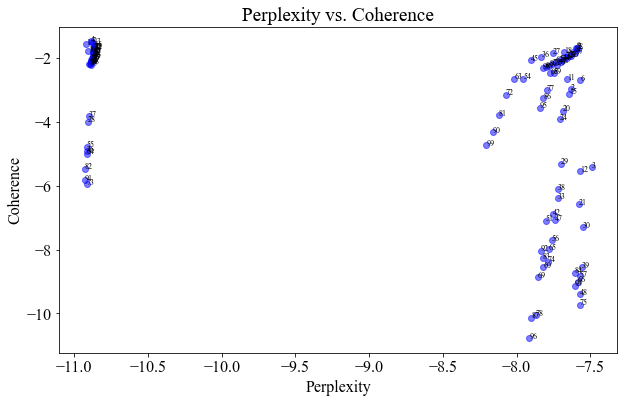

Results exported to parameter_tuning_results.csv


In [70]:
import csv

# Perform parameter tuning
combinations = []
total_combinations = len(K_values) * len(alpha_values) * len(beta_values)
combination_count = 0

for K in K_values:
    for alpha in alpha_values:
        for beta in beta_values:
            combination_count += 1
            print("Combination {} out of {}: K={}, alpha={}, beta={}".format(combination_count, total_combinations, K, alpha, beta))
            
            perplexity, umass = perform_cross_validation(K, alpha, beta, corpus)
            
            # Save the combination and its measures
            combination = {
                'K': K,
                'alpha': alpha,
                'beta': beta,
                'perplexity': perplexity,
                'coherence': umass
            }
            combinations.append(combination)

# Extract Coherence and Perplexity values
coherence_values = [c['coherence'] for c in combinations]
perplexity_values = [c['perplexity'] for c in combinations]

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(perplexity_values, coherence_values, marker='o', c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Perplexity')
plt.ylabel('Coherence')
plt.title('Perplexity vs. Coherence')

# Add combination number labels
for i, c in enumerate(combinations):
    plt.text(c['perplexity'], c['coherence'], str(i + 1), fontsize=8)

# Display the plot
plt.show()

# Export results to a CSV file
filename = 'parameter_tuning_results.csv'
header = ['Combination', 'K', 'alpha', 'beta', 'Perplexity', 'Coherence']

with open(filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(header)
    for i, combination in enumerate(combinations):
        writer.writerow([i + 1, combination['K'], combination['alpha'], combination['beta'], combination['perplexity'], combination['coherence']])

print("Results exported to", filename)


KeyError: 'combination'

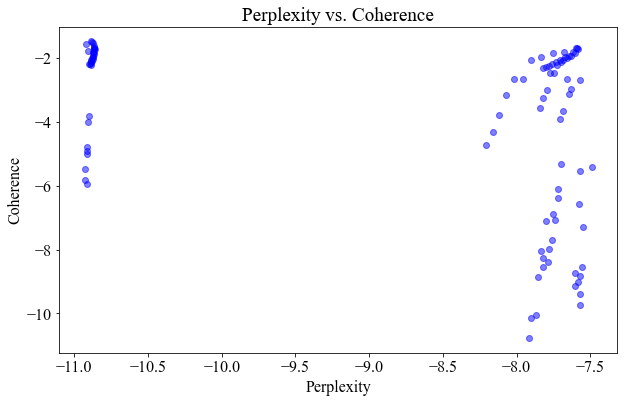

In [71]:
from matplotlib import rcParams

# Set the font family to Times New Roman
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']

# Extract Coherence and Perplexity values
coherence_values = [c['coherence'] for c in combinations]
perplexity_values = [c['perplexity'] for c in combinations]

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(perplexity_values, coherence_values, marker='o', c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Perplexity')
plt.ylabel('Coherence')
plt.title('Perplexity vs. Coherence')

# Add combination number labels
for c in combinations:
    plt.text(c['perplexity'], c['coherence'], str(c['combination']), fontsize=8)

# Display the plot
plt.show()

In [75]:
# Store results
import pickle
with open("test", "wb") as fp:   #Pickling
    pickle.dump(combinations, fp)

In [3]:
import pickle
with open("test", "rb") as fp:   # Unpickling
       combinations = pickle.load(fp)
        
combinations

[{'K': 5,
  'alpha': 0.1,
  'beta': 0.05,
  'perplexity': -10.922839731065798,
  'coherence': -1.5727219083178974},
 {'K': 5,
  'alpha': 0.1,
  'beta': 0.1,
  'perplexity': -7.63173339832783,
  'coherence': -2.9800441080309126},
 {'K': 5,
  'alpha': 0.1,
  'beta': 0.5,
  'perplexity': -7.489285403517213,
  'coherence': -5.418082819226079},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.05,
  'perplexity': -10.885930015189638,
  'coherence': -1.4859220856742021},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.1,
  'perplexity': -7.592001705316572,
  'coherence': -1.6987841696638057},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.5,
  'perplexity': -7.568012958884364,
  'coherence': -2.694869429763639},
 {'K': 5,
  'alpha': 1,
  'beta': 0.05,
  'perplexity': -10.882249908965623,
  'coherence': -1.5142221293521214},
 {'K': 5,
  'alpha': 1,
  'beta': 0.1,
  'perplexity': -7.582543071271905,
  'coherence': -1.7091368495126873},
 {'K': 5,
  'alpha': 1,
  'beta': 0.5,
  'perplexity': -7.59491908022188,
  'coherence': 

## Zooming in into scatterplot

In [4]:
numbered_combinations = []
for i, combination in enumerate(combinations):
    combination['number'] = i + 1
    numbered_combinations.append(combination)

In [5]:
numbered_combinations

[{'K': 5,
  'alpha': 0.1,
  'beta': 0.05,
  'perplexity': -10.922839731065798,
  'coherence': -1.5727219083178974,
  'number': 1},
 {'K': 5,
  'alpha': 0.1,
  'beta': 0.1,
  'perplexity': -7.63173339832783,
  'coherence': -2.9800441080309126,
  'number': 2},
 {'K': 5,
  'alpha': 0.1,
  'beta': 0.5,
  'perplexity': -7.489285403517213,
  'coherence': -5.418082819226079,
  'number': 3},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.05,
  'perplexity': -10.885930015189638,
  'coherence': -1.4859220856742021,
  'number': 4},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.1,
  'perplexity': -7.592001705316572,
  'coherence': -1.6987841696638057,
  'number': 5},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.5,
  'perplexity': -7.568012958884364,
  'coherence': -2.694869429763639,
  'number': 6},
 {'K': 5,
  'alpha': 1,
  'beta': 0.05,
  'perplexity': -10.882249908965623,
  'coherence': -1.5142221293521214,
  'number': 7},
 {'K': 5,
  'alpha': 1,
  'beta': 0.1,
  'perplexity': -7.582543071271905,
  'coherence': -1.709

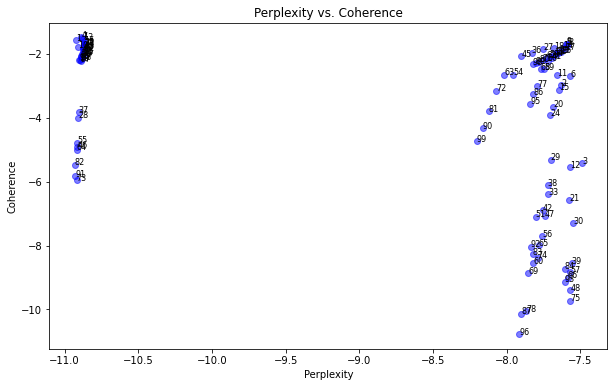

In [8]:
# Extract Coherence and Perplexity values
coherence_values = [c['coherence'] for c in numbered_combinations]
perplexity_values = [c['perplexity'] for c in numbered_combinations]

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(perplexity_values, coherence_values, marker='o', c='blue', alpha=0.5)

# Add labels and title
plt.xlabel('Perplexity')
plt.ylabel('Coherence')
plt.title('Perplexity vs. Coherence')

# Add combination number labels
for c in combinations:
    plt.text(c['perplexity'], c['coherence'], str(c['number']), fontsize=8)

# Display the plot
plt.show()

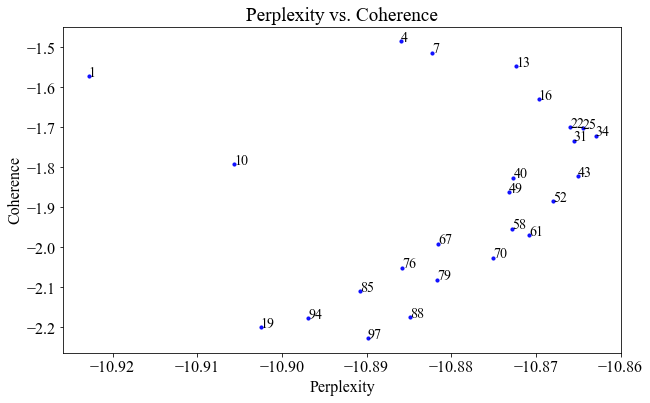

In [22]:
import matplotlib.pyplot as plt

filtered_combinations = [c for c in combinations if -10.5 >= c['perplexity'] and c['coherence'] >= -3.5]

# Extract Coherence and Perplexity values
coherence_values = [c['coherence'] for c in filtered_combinations]
perplexity_values = [c['perplexity'] for c in filtered_combinations]

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(perplexity_values, coherence_values, marker='o', c='blue', alpha=0.9, s=10)

# Add labels and title
plt.xlabel('Perplexity')
plt.ylabel('Coherence')
plt.title('Perplexity vs. Coherence')

# Add combination number labels
for c in filtered_combinations:
    plt.text(c['perplexity'], c['coherence'], str(c['number']), fontsize=14)

# Display the plot
plt.show()


In [105]:
filtered_combinations

[{'K': 5,
  'alpha': 0.1,
  'beta': 0.05,
  'perplexity': -10.922839731065798,
  'coherence': -1.5727219083178974,
  'number': 1},
 {'K': 5,
  'alpha': 0.5,
  'beta': 0.05,
  'perplexity': -10.885930015189638,
  'coherence': -1.4859220856742021,
  'number': 4},
 {'K': 5,
  'alpha': 1,
  'beta': 0.05,
  'perplexity': -10.882249908965623,
  'coherence': -1.5142221293521214,
  'number': 7},
 {'K': 6,
  'alpha': 0.1,
  'beta': 0.05,
  'perplexity': -10.905626391860816,
  'coherence': -1.79310165310573,
  'number': 10},
 {'K': 6,
  'alpha': 0.5,
  'beta': 0.05,
  'perplexity': -10.872308955581016,
  'coherence': -1.5482379723373783,
  'number': 13},
 {'K': 6,
  'alpha': 1,
  'beta': 0.05,
  'perplexity': -10.869677476479733,
  'coherence': -1.6298894824613162,
  'number': 16},
 {'K': 7,
  'alpha': 0.1,
  'beta': 0.05,
  'perplexity': -10.902491267960569,
  'coherence': -2.2011258704231804,
  'number': 19},
 {'K': 7,
  'alpha': 0.5,
  'beta': 0.05,
  'perplexity': -10.865921252006107,
  'coh

#### Create table

In [109]:
# Transform list of dictionaries to list of tuples
data_tuples = [(d['number'], d['K'], d['alpha'], d['beta'], d['perplexity'], d['coherence']) for d in filtered_combinations]

from tabulate import tabulate

headers = ['Combination', 'K', 'Alpha', 'Beta', 'Perplexity', 'Coherence']

table_str = tabulate(data_tuples, headers=headers, tablefmt='latex')

print(table_str)

\begin{tabular}{rrrrrr}
\hline
   Combination &   K &   Alpha &   Beta &   Perplexity &   Coherence \\
\hline
             1 &   5 &     0.1 &   0.05 &     -10.9228 &    -1.57272 \\
             4 &   5 &     0.5 &   0.05 &     -10.8859 &    -1.48592 \\
             7 &   5 &     1   &   0.05 &     -10.8822 &    -1.51422 \\
            10 &   6 &     0.1 &   0.05 &     -10.9056 &    -1.7931  \\
            13 &   6 &     0.5 &   0.05 &     -10.8723 &    -1.54824 \\
            16 &   6 &     1   &   0.05 &     -10.8697 &    -1.62989 \\
            19 &   7 &     0.1 &   0.05 &     -10.9025 &    -2.20113 \\
            22 &   7 &     0.5 &   0.05 &     -10.8659 &    -1.70004 \\
            25 &   7 &     1   &   0.05 &     -10.8644 &    -1.70319 \\
            31 &   8 &     0.5 &   0.05 &     -10.8655 &    -1.73454 \\
            34 &   8 &     1   &   0.05 &     -10.8629 &    -1.72136 \\
            40 &   9 &     0.5 &   0.05 &     -10.8727 &    -1.82714 \\
            43 &   9 &    

In [114]:
filtered_param_combinations = [d for d in filtered_combinations if d['alpha'] == 0.5 and d['beta'] == 0.05]

# Print the filtered data
print(filtered_param_combinations)

[{'K': 5, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.885930015189638, 'coherence': -1.4859220856742021, 'number': 4}, {'K': 6, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.872308955581016, 'coherence': -1.5482379723373783, 'number': 13}, {'K': 7, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.865921252006107, 'coherence': -1.7000367228908762, 'number': 22}, {'K': 8, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.86553757432196, 'coherence': -1.7345444679566149, 'number': 31}, {'K': 9, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.872664647656105, 'coherence': -1.8271374684078203, 'number': 40}, {'K': 10, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.873228491607133, 'coherence': -1.8623426404310859, 'number': 49}, {'K': 11, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.872784276983683, 'coherence': -1.9537661487576419, 'number': 58}, {'K': 12, 'alpha': 0.5, 'beta': 0.05, 'perplexity': -10.881553378554765, 'coherence': -1.9921274772217696, 'number': 67}, {'K': 13, 'alpha': 0.5, 'beta'

In [116]:
import gensim
import pandas as pd
from pprint import pprint

# Define the parameters for LDA model
random_seed = 1
update_every = 1
chunksize = 100
passes = 10

# Iterate over the filtered combinations
for i, combination in enumerate(filtered_param_combinations):
    alpha = combination['alpha']
    beta = combination['beta']
    num_topics = combination['K']

    # Create the LDA model
    lda_model_i = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                                  id2word=id2word,
                                                  num_topics=num_topics,
                                                  random_state=random_seed,
                                                  update_every=update_every,
                                                  chunksize=chunksize,
                                                  passes=passes,
                                                  alpha=alpha,
                                                  eta=beta,
                                                  per_word_topics=True)

    # Store the LDA model for the current combination
    model_number = combination['number']
    lda_model_i.save(f"lda_model_{model_number}.model")

    # Print the topic distribution for the current combination
    print(f"Topic Distribution of Combination {model_number} (K: {num_topics}, Alpha: {alpha}, Beta: {beta}):")
    pprint(lda_model_i.print_topics())

    # Get the topic distribution for each document in the LDA model
    topic_distribution = lda_model_i.get_document_topics(corpus, minimum_probability=0.0)

    # Count the number of documents for each dominant topic
    dominant_topics = [max(doc, key=lambda x: x[1])[0] for doc in topic_distribution]
    topic_counts = pd.Series(dominant_topics).value_counts().reset_index()
    topic_counts.columns = ['Topic Num', 'Num Documents']
    print(topic_counts)

    print()


Topic Distribution of Combination 4 (K: 5, Alpha: 0.5, Beta: 0.05):
[(0,
  '0.109*"flight" + 0.068*"hour" + 0.043*"delay" + 0.029*"time" + '
  '0.021*"arrive" + 0.021*"minute" + 0.019*"wait" + 0.018*"get" + '
  '0.018*"plane" + 0.017*"leave"'),
 (1,
  '0.058*"check" + 0.043*"luggage" + 0.034*"bag" + 0.024*"boarding" + '
  '0.021*"staff" + 0.020*"seat" + 0.017*"go" + 0.017*"passenger" + '
  '0.016*"plane" + 0.013*"ask"'),
 (2,
  '0.045*"seat" + 0.043*"flight" + 0.026*"good" + 0.024*"class" + 0.024*"food" '
  '+ 0.021*"crew" + 0.018*"service" + 0.017*"business" + 0.016*"cabin" + '
  '0.015*"economy"'),
 (3,
  '0.071*"airline" + 0.051*"fly" + 0.032*"pay" + 0.026*"bad" + '
  '0.020*"experience" + 0.018*"flight" + 0.018*"service" + 0.017*"even" + '
  '0.017*"never" + 0.017*"travel"'),
 (4,
  '0.035*"flight" + 0.026*"customer" + 0.024*"day" + 0.023*"tell" + '
  '0.022*"call" + 0.019*"service" + 0.019*"cancel" + 0.017*"ticket" + '
  '0.017*"get" + 0.016*"say"')]
   Topic Num  Num Documents
0 

### Optimal combination: 
Combination 58 (K: 11, Alpha: 0.5, Beta: 0.05):
•	Topic 0: …
•	Topic 1: Luggage and Baggage Check
•	Topic 2: In-Flight Experience
•	Topic 3: Airline Experience
•	Topic 4: Assistance at the Airport
•	Topic 5: Ticketing and Booking
•	Topic 6: Customer Service and Refunds
•	Topic 7: Boarding and Time Management
•	Topic 8: Seating and Classes
•	Topic 9: Staff Behavior and Travel Experience
•	Topic 10: Flight Delays and Cancellations

In [127]:
random_seed = 1
update_every = 1
chunksize = 100
passes = 10



optimized_lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                                  id2word=id2word,
                                                  num_topics=11,
                                                  random_state=random_seed,
                                                  update_every=update_every,
                                                  chunksize=chunksize,
                                                  passes=passes,
                                                  alpha=0.5,
                                                  eta=0.05,
                                                  per_word_topics=True)

In [128]:
pprint(optimized_lda_model.print_topics())
doc_lda = optimized_lda_model[corpus]

# Get the topic distribution for each document in the LDA model
topic_distribution = optimized_lda_model.get_document_topics(corpus, minimum_probability=0.0)
    
# Count the number of documents for each dominant topic
dominant_topics = [max(doc, key=lambda x: x[1])[0] for doc in topic_distribution]
topic_counts = pd.Series(dominant_topics).value_counts().reset_index()
topic_counts.columns = ['Topic Num', 'Num Documents']
print(topic_counts)

[(0,
  '0.108*"get" + 0.058*"go" + 0.048*"back" + 0.044*"way" + 0.044*"say" + '
  '0.029*"make" + 0.025*"know" + 0.024*"come" + 0.019*"people" + 0.018*"see"'),
 (1,
  '0.171*"check" + 0.128*"luggage" + 0.100*"bag" + 0.047*"baggage" + '
  '0.027*"airport" + 0.024*"arrive" + 0.021*"hand" + 0.020*"online" + '
  '0.017*"priority" + 0.016*"deliver"'),
 (2,
  '0.072*"flight" + 0.045*"good" + 0.036*"food" + 0.033*"crew" + 0.028*"cabin" '
  '+ 0.022*"service" + 0.020*"meal" + 0.019*"drink" + 0.018*"nice" + '
  '0.017*"friendly"'),
 (3,
  '0.125*"fly" + 0.064*"time" + 0.062*"airline" + 0.033*"use" + 0.029*"first" '
  '+ 0.029*"many" + 0.029*"trip" + 0.025*"really" + 0.024*"year" + '
  '0.023*"last"'),
 (4,
  '0.090*"tell" + 0.051*"ask" + 0.030*"help" + 0.027*"give" + 0.019*"go" + '
  '0.018*"desk" + 0.018*"airport" + 0.017*"call" + 0.017*"able" + '
  '0.016*"speak"'),
 (5,
  '0.084*"pay" + 0.070*"ticket" + 0.050*"flight" + 0.040*"change" + '
  '0.037*"book" + 0.032*"extra" + 0.030*"buy" + 0.025

In [213]:
topics

[(9,
  [('airline', 0.091326304),
   ('bad', 0.062749006),
   ('service', 0.06151529),
   ('experience', 0.053071488),
   ('never', 0.039048016),
   ('staff', 0.038345717),
   ('fly', 0.034408838),
   ('customer', 0.034182414),
   ('travel', 0.028821303),
   ('ever', 0.025883028)]),
 (0,
  [('get', 0.10771587),
   ('go', 0.05829201),
   ('back', 0.048319712),
   ('way', 0.04439075),
   ('say', 0.043922912),
   ('make', 0.029393204),
   ('know', 0.024658035),
   ('come', 0.024439061),
   ('people', 0.019365076),
   ('see', 0.017755281)]),
 (6,
  [('day', 0.045507304),
   ('customer', 0.04131432),
   ('cancel', 0.040763892),
   ('call', 0.03609837),
   ('email', 0.031077681),
   ('receive', 0.029934231),
   ('lose', 0.02908621),
   ('flight', 0.02908387),
   ('service', 0.02860787),
   ('refund', 0.027297195)]),
 (2,
  [('flight', 0.07249775),
   ('good', 0.045202706),
   ('food', 0.0355425),
   ('crew', 0.03297761),
   ('cabin', 0.027650362),
   ('service', 0.02212409),
   ('meal', 0.02

C:\Users\70608ebe\AppData\Local\Temp\ipykernel_17828\4096022684.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment='right')
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_17828\4096022684.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment='right')
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_17828\4096022684.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment='right')
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_17828\4096022684.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment='right')
C:\Users\70608ebe\AppData\Local\Temp

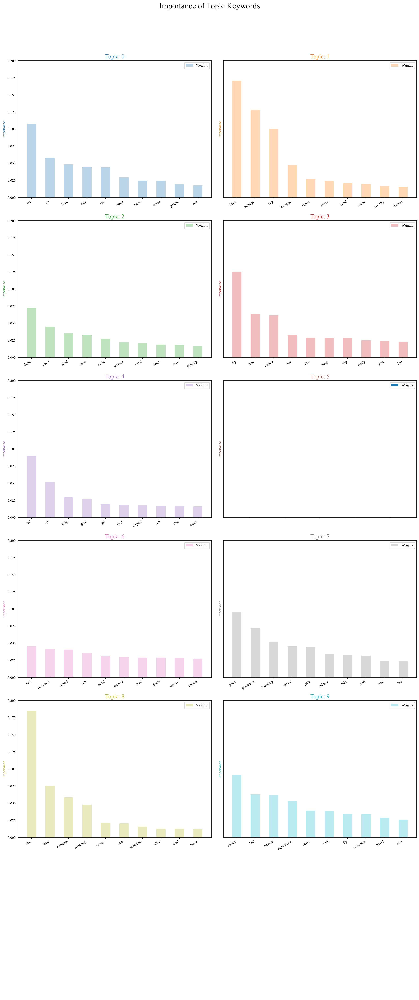

In [209]:
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import colors

# Get the topics from the LDA model
topics = optimized_lda_model.show_topics(formatted=False)

# Create a flat list of words from the lemmatized data
data_flat = [w for w_list in data_lemmatized for w in w_list]

# Count the occurrences of each word
counter = Counter(data_flat)

# Prepare the data for plotting
out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i, weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

# Calculate the number of rows and columns for the subplots grid
num_topics = len(topics)
num_rows = 6
num_cols = 2

# Plot Importance of Topic Keywords
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 6*num_rows), sharey=True, dpi=160)
cols = [color for name, color in colors.TABLEAU_COLORS.items()]
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < num_topics:
        ax.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Weights')
        ax.set_ylabel('Importance', color=cols[i])
        ax.set_ylim(0, 0.2)
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper right')
    else:
        ax.axis('off')

fig.tight_layout(w_pad=2)
fig.suptitle('Importance of Topic Keywords', fontsize=22, y=1.05)
plt.show()




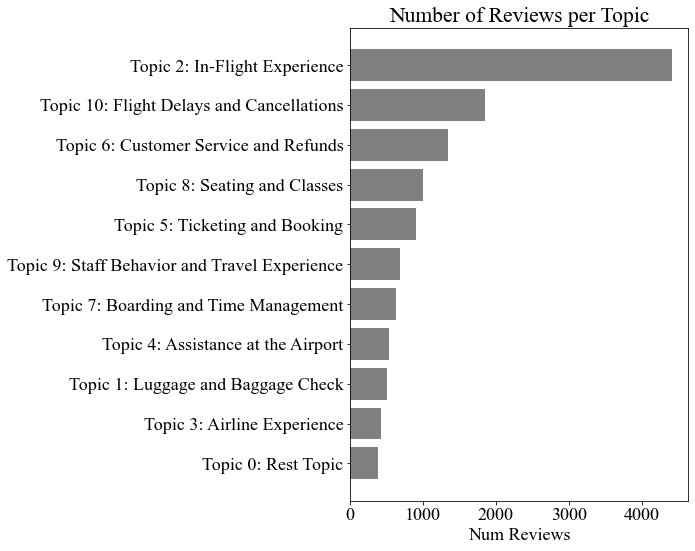

In [44]:
import matplotlib.pyplot as plt
import pandas as pd

# Define the topic names and counts data
data = {
    'Topic Name': [
        'Topic 2: In-Flight Experience',
        'Topic 10: Flight Delays and Cancellations',
        'Topic 6: Customer Service and Refunds',
        'Topic 8: Seating and Classes',
        'Topic 5: Ticketing and Booking',
        'Topic 9: Staff Behavior and Travel Experience',
        'Topic 7: Boarding and Time Management',
        'Topic 4: Assistance at the Airport',
        'Topic 1: Luggage and Baggage Check',
        'Topic 3: Airline Experience',
        'Topic 0: Rest Topic'
    ],
    'Num Documents': [4416, 1841, 1340, 1001, 900, 681, 622, 527, 509, 425, 376]
}

# Create a DataFrame from the data
topic_counts = pd.DataFrame(data)

# Sort the DataFrame by Num Documents in descending order
topic_counts = topic_counts.sort_values('Num Documents', ascending=True)

# Plot the horizontal bar chart
plt.figure(figsize=(10, 8))
plt.barh(topic_counts['Topic Name'], topic_counts['Num Documents'], color='grey')
plt.xlabel('Num Reviews')
plt.title('Number of Reviews per Topic')
plt.tight_layout()
plt.show()



In [219]:
topics = optimized_lda_model.show_topics(formatted=False)
topics

[(1,
  [('check', 0.17093225),
   ('luggage', 0.12821802),
   ('bag', 0.10028378),
   ('baggage', 0.047442734),
   ('airport', 0.02682542),
   ('arrive', 0.024067521),
   ('hand', 0.02137779),
   ('online', 0.019932102),
   ('priority', 0.016730485),
   ('deliver', 0.015605329)]),
 (5,
  [('pay', 0.083681285),
   ('ticket', 0.06969516),
   ('flight', 0.05047031),
   ('change', 0.039806567),
   ('book', 0.036668908),
   ('extra', 0.03172566),
   ('buy', 0.029891547),
   ('cost', 0.0245462),
   ('charge', 0.024224687),
   ('money', 0.0225074)]),
 (0,
  [('get', 0.10771587),
   ('go', 0.05829201),
   ('back', 0.048319712),
   ('way', 0.04439075),
   ('say', 0.043922912),
   ('make', 0.029393204),
   ('know', 0.024658035),
   ('come', 0.024439061),
   ('people', 0.019365076),
   ('see', 0.017755281)]),
 (6,
  [('day', 0.045507304),
   ('customer', 0.04131432),
   ('cancel', 0.040763892),
   ('call', 0.03609837),
   ('email', 0.031077681),
   ('receive', 0.029934231),
   ('lose', 0.02908621

In [227]:
import numpy as np

# Get the dominant topic for each document
dominant_topics = []
for doc_topics in document_topics:
    dominant_topic = max(doc_topics, key=lambda x: x[1])[0]
    dominant_topics.append(dominant_topic)

# Print the dominant topic for each document
#for i, dominant_topic in enumerate(dominant_topics):
#   print(f"Review {i + 1}: Dominant Topic - {dominant_topic}")


In [237]:
data = data.assign(dominant_topic=dominant_topics)
data.head(5)

,airline,ratingValue,author,country,reviewText,verified,type_of_traveller,cabin_flown,date_flown,seat_comfort,...,is_english,year_flown,continent,reviewText_char_count,period,processed_review,compound_score,overall_sentiment,sentiment_scores,dominant_topic
0,TAP Portugal,7,594f7ce5800c4faff13c0518221598fafc95fe7822c1d9792adf767e52fa09a1,United Kingdom,"Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful airport.",True,Couple Leisure,Business Class,May 2023,3.0,...,1,2023,Europe,1007,1,"Used TAP from LGW as no direct flight from Heathrow, check in quick as was fast track security the lounge No 1 lounge was okay. Boarding pretty organised so quickly at our seats A1 & A3 business class typically middle seat blocked, departed on time once in the air lunch served which was fine. Crew where good with extra drinks served arrived on time after 2 hours and waited 20 min for bags. Returned in economy check in quick as was security, used the lounge through my FF status boarding quick and the flight departed about 20 minutes late. Crew where fine as where the seats A4 & B4, TAP like many airlines in Europe serve nothing in economy not even water which I don't understand, otherwise the trip was good and having used TAP on 4 flights over the previous 6 months I wouldn't hesitate to use them again. Only let down was the check in experience at Gatwick, the agent didn't speak once she actually looked like she had just fallen out of bed, and sums up London Gatwick itself! A dreadful airport.",0.9436,Positive,"{'neg': 0.059, 'neu': 0.792, 'pos': 0.149, 'compound': 0.9436}",2
1,TAP Portugal,1,aced8334e429b631298259865985f84fedeb92b8e78e98360381e361da774435,Belgium,"There were enough counters to check in for business class but boarding was a disaster. The plane was not at a gate and a rather long drive by a bus was necessary. Old 319 with very hard seats. With a business class ticket one could go to the bus first but that was it. The captain gave some information before and also during the flight. The inflight service was extremely poor, one of the most scandalous business classes in Europe. A plate with some cold stuff and 2 slices of a dark stale bread no rolls at all - extremely poor and limited choice of drinks. On a 2.30 hour flight just one drink? FA were very neutral. I was happy the flight was over and Brussels was reached some 10 min ahead. I never will book this airline again. Avoid TAP !!",True,Business,Business Class,May 2023,1.0,...,1,2023,Europe,747,1,"There were enough counters to check in for business class but boarding was a disaster. The plane was not at a gate and a rather long drive by a bus was necessary. Old 319 with very hard seats. With a business class ticket one could go to the bus first but that was it. The captain gave some information before and also during the flight. The inflight service was extremely poor, one of the most scandalous business classes in Europe. A plate with some cold stuff and 2 slices of a dark stale bread no rolls at all - extremely poor and limited choice of drinks. On

In [8]:
# Create a dictionary to map topic numbers to names
topic_names = {
    2: 'Topic 2: In-Flight Experience',
    10: 'Topic 10: Flight Delays and Cancellations',
    6: 'Topic 6: Customer Service and Refunds',
    8: 'Topic 8: Seating and Classes',
    5: 'Topic 5: Ticketing and Booking',
    9: 'Topic 9: Staff Behavior and Travel Experience',
    7: 'Topic 7: Boarding and Time Management',
    4: 'Topic 4: Assistance at the Airport',
    1: 'Topic 1: Luggage and Baggage Check',
    3: 'Topic 3: Airline Experience',
    0: 'Topic 0: Rest Topic'
}

# Add a new column 'topic_name' to the DataFrame using the 'dominant_topic' column
data['topic_name'] = data['dominant_topic'].map(topic_names)


In [9]:
data.to_csv('topic_modelling_data.csv', index=False)

### Topics over Time

In [3]:
data = pd.read_csv('topic_modelling_data.csv')

In [15]:
pd.set_option('display.max_colwidth', None)

selected_rows = data[data['dominant_topic'] == 0]
processed_reviews = selected_rows['processed_review']
print(processed_reviews)

48                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  Amsterdam to Lisbon was okay since there was only on

In [31]:
# Filter the data for each period
period1_data = data[data['period'] == 0]
period2_data = data[data['period'] == 1]

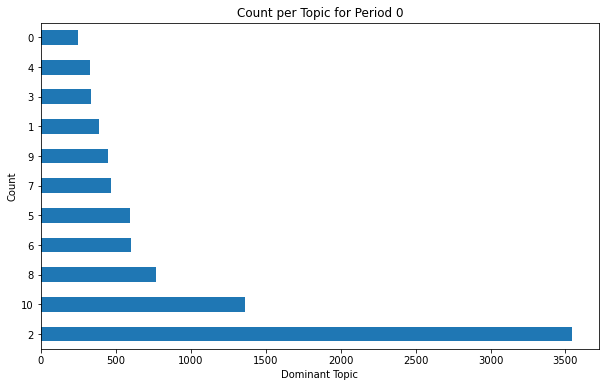

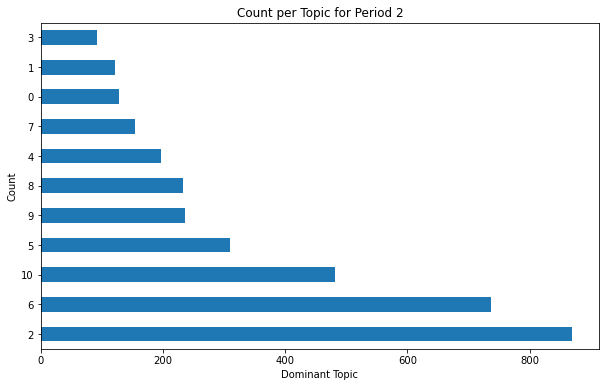

In [6]:
# Group the data by 'dominant_topic' and count the occurrences
topic_counts = period1_data['dominant_topic'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Optional: adjust the figure size
topic_counts.plot(kind='barh')
plt.title('Count per Topic for Period 0')
plt.xlabel('Dominant Topic')
plt.ylabel('Count')
plt.show()

# Group the data by 'dominant_topic' and count the occurrences
topic_counts = period2_data['dominant_topic'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Optional: adjust the figure size
topic_counts.plot(kind='barh')
plt.title('Count per Topic for Period 2')
plt.xlabel('Dominant Topic')
plt.ylabel('Count')
plt.show()

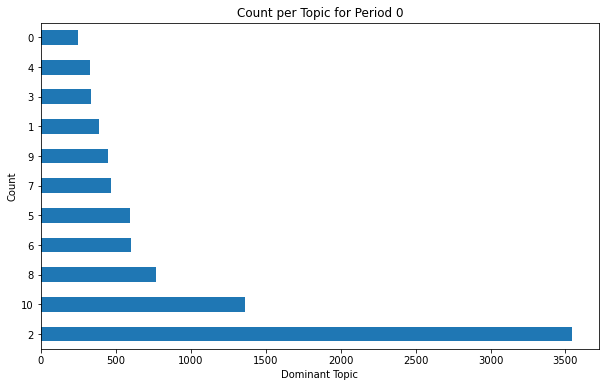

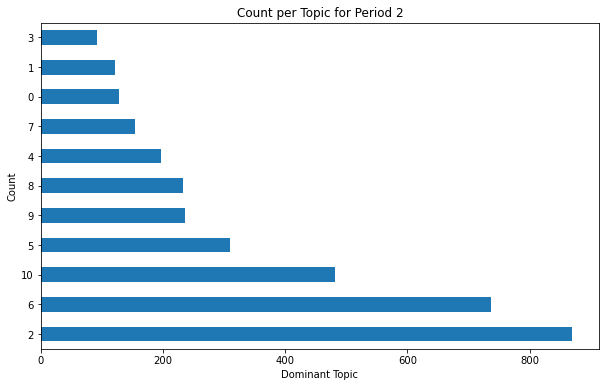

In [23]:
# Group the data by 'dominant_topic' and count the occurrences
topic_counts = period1_data['dominant_topic'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Optional: adjust the figure size
topic_counts.plot(kind='barh')
plt.title('Count per Topic for Period 0')
plt.xlabel('Dominant Topic')
plt.ylabel('Count')
plt.show()

# Group the data by 'dominant_topic' and count the occurrences
topic_counts = period2_data['dominant_topic'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Optional: adjust the figure size
topic_counts.plot(kind='barh')
plt.title('Count per Topic for Period 2')
plt.xlabel('Dominant Topic')
plt.ylabel('Count')
plt.show()

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Group data by 'year_flown' and 'dominant_topic' and count the reviews in each group
topic_counts = data.groupby(['year_flown', 'dominant_topic']).size().unstack()

# Calculate the total number of reviews per year
year_totals = topic_counts.sum(axis=1)

# Convert year_totals to a DataFrame with a named column
year_totals = year_totals.to_frame(name='review_count_y')

# Merge the topic counts and year totals dataframes
topic_percentages = pd.merge(topic_counts, year_totals, left_index=True, right_index=True)

# Calculate the percentage of reviews per topic per year
topic_percentages = topic_percentages.divide(topic_percentages['review_count_y'], axis=0) * 100

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))

for topic in topic_percentages.columns[:-1]:
    ax.plot(topic_percentages.index, topic_percentages[topic], label=topic)

ax.legend()
ax.set_xlabel('Year')
ax.set_xlim(2016, 2022)  # Set x-axis limits
ax.set_ylabel('% of Reviews')
plt.show()



AttributeError: 'dict' object has no attribute 'groupby'

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Group the data by 'dominant_topic' and count the occurrences for period 1
topic_counts_period1 = period1_data['topic_name'].value_counts()

# Group the data by 'dominant_topic' and count the occurrences for period 2
topic_counts_period2 = period2_data['topic_name'].value_counts()

# Calculate the total number of reviews for each period
total_reviews_period1 = topic_counts_period1.sum()
total_reviews_period2 = topic_counts_period2.sum()

# Calculate the percentage of total reviews for each topic in period 1 and period 2
percentages_period1 = (topic_counts_period1 / total_reviews_period1) * 100
percentages_period2 = (topic_counts_period2 / total_reviews_period2) * 100

# Create a DataFrame to store the topic counts and percentages
df = pd.DataFrame({
    'Topic': unique_topics,
    'Count Period 1': topic_counts_period1.reindex(unique_topics),
    'Count Period 2': topic_counts_period2.reindex(unique_topics),
    '% Period 1': percentages_period1.reindex(unique_topics),
    '% Period 2': percentages_period2.reindex(unique_topics)
})

# Display the DataFrame
print(df)


                                                                                       Topic  \
Topic 0: Rest Topic                                                      Topic 0: Rest Topic   
Topic 10: Flight Delays and Cancellations          Topic 10: Flight Delays and Cancellations   
Topic 1: Luggage and Baggage Check                        Topic 1: Luggage and Baggage Check   
Topic 2: In-Flight Experience                                  Topic 2: In-Flight Experience   
Topic 3: Airline Experience                                      Topic 3: Airline Experience   
Topic 4: Assistance at the Airport                        Topic 4: Assistance at the Airport   
Topic 5: Ticketing and Booking                                Topic 5: Ticketing and Booking   
Topic 6: Customer Service and Refunds                  Topic 6: Customer Service and Refunds   
Topic 7: Boarding and Time Management                  Topic 7: Boarding and Time Management   
Topic 8: Seating and Classes            

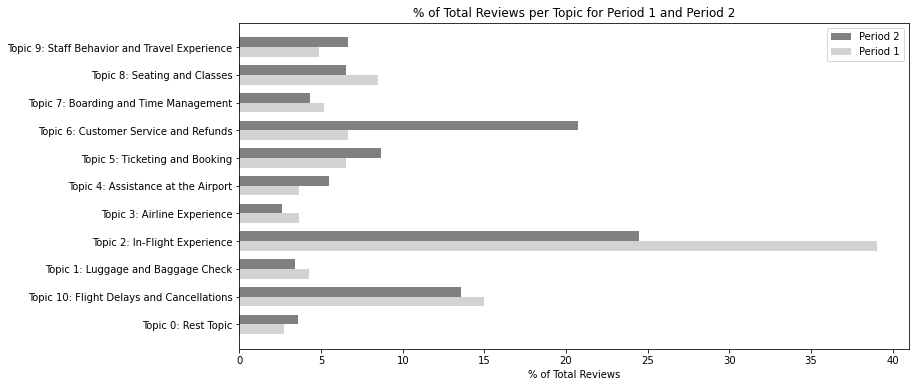

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Group the data by 'dominant_topic' and count the occurrences for period 1
topic_counts_period1 = period1_data['topic_name'].value_counts()

# Group the data by 'dominant_topic' and count the occurrences for period 2
topic_counts_period2 = period2_data['topic_name'].value_counts()

# Calculate the total number of reviews for each period
total_reviews_period1 = topic_counts_period1.sum()
total_reviews_period2 = topic_counts_period2.sum()

# Get the unique topics
unique_topics = sorted(set(topic_counts_period1.index) | set(topic_counts_period2.index))

# Calculate the percentage of total reviews for each topic in period 1 and period 2
percentages_period1 = (topic_counts_period1 / total_reviews_period1) * 100
percentages_period2 = (topic_counts_period2 / total_reviews_period2) * 100

# Set the width of each bar
bar_width = 0.35

# Calculate the positions for the bars
r1 = np.arange(len(unique_topics))
r2 = [x + bar_width for x in r1]

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the bars for period 2
ax.barh(r2, percentages_period2.reindex(unique_topics), height=bar_width, color='grey', label='Period 2')

# Plot the bars for period 1
ax.barh(r1, percentages_period1.reindex(unique_topics), height=bar_width, color='lightgrey', label='Period 1')

# Set the y-axis labels to the topics
ax.set_yticks((r1 + r2) / 2)
ax.set_yticklabels(unique_topics)

# Set the x-axis label and title
ax.set_xlabel('% of Total Reviews')
ax.set_title('% of Total Reviews per Topic for Period 1 and Period 2')

# Add a legend
ax.legend()

# Show the combined plot
plt.show()


C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\3286514359.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\3286514359.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['month_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.month
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\3286514359.py:27: SettingWithCopyWarning: 
A value is tryin

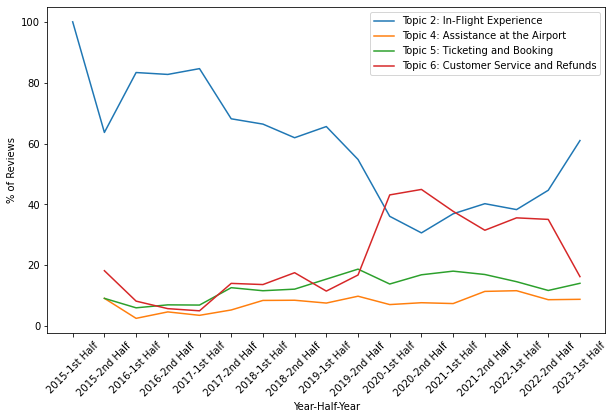

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the four topics of interest
topics_of_interest = [
    'Topic 2: In-Flight Experience',
    'Topic 4: Assistance at the Airport',
    'Topic 5: Ticketing and Booking',
    'Topic 6: Customer Service and Refunds'
]

# Filter the data DataFrame to include only the topics of interest
filtered_data = data[data['topic_name'].isin(topics_of_interest)]

# Extract year and month from the 'date_flown' column
filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
filtered_data['month_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.month

# Define a function to map month to half-year
def map_to_half_year(month):
    if month <= 6:
        return '1st Half'
    else:
        return '2nd Half'

# Map the month to half-year
filtered_data['half_year'] = filtered_data['month_flown'].map(map_to_half_year)

# Group the filtered data by 'year_flown', 'half_year', and 'topic_name' and count the reviews in each group
topic_counts = filtered_data.groupby(['year_flown', 'half_year', 'topic_name']).size().unstack()

# Calculate the total number of reviews per half-year
half_year_totals = filtered_data.groupby(['year_flown', 'half_year']).size()

# Convert half_year_totals to a DataFrame with a named column
half_year_totals = half_year_totals.to_frame(name='review_count_hy')

# Merge the topic counts and half-year totals dataframes
topic_percentages = pd.merge(topic_counts, half_year_totals, left_index=True, right_index=True)

# Calculate the percentage of reviews per topic per half-year
topic_percentages = topic_percentages.div(topic_percentages['review_count_hy'], axis=0) * 100

# Convert the multi-index into formatted strings for year and half-year
topic_percentages.index = topic_percentages.index.map(lambda x: f"{x[0]}-{x[1]}")

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))

for topic in topics_of_interest:
    ax.plot(topic_percentages.index, topic_percentages[topic], label=topic)

ax.legend()
ax.set_xlabel('Year-Half-Year')
ax.set_ylabel('% of Reviews')
plt.xticks(rotation=45)
plt.show()




C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\806262514.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\806262514.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['month_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.month
C:\Users\70608ebe\AppData\Local\Temp\ipykernel_12360\806262514.py:29: SettingWithCopyWarning: 
A value is trying t

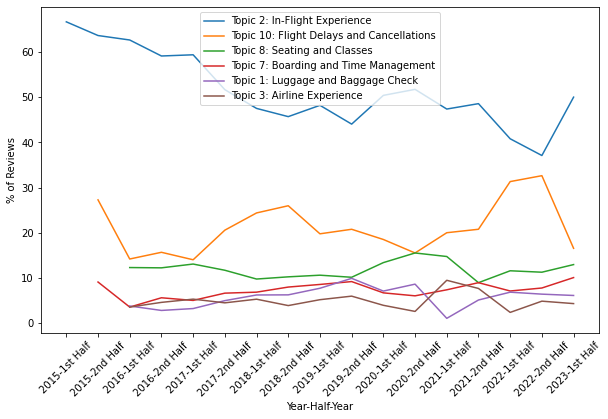

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the four topics of interest
topics_of_interest = [
    'Topic 2: In-Flight Experience',
    'Topic 10: Flight Delays and Cancellations',
    'Topic 8: Seating and Classes',
    'Topic 7: Boarding and Time Management',
    'Topic 1: Luggage and Baggage Check',
    'Topic 3: Airline Experience'
]

# Filter the data DataFrame to include only the topics of interest
filtered_data = data[data['topic_name'].isin(topics_of_interest)]

# Extract year and month from the 'date_flown' column
filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
filtered_data['month_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.month

# Define a function to map month to half-year
def map_to_half_year(month):
    if month <= 6:
        return '1st Half'
    else:
        return '2nd Half'

# Map the month to half-year
filtered_data['half_year'] = filtered_data['month_flown'].map(map_to_half_year)

# Group the filtered data by 'year_flown', 'half_year', and 'topic_name' and count the reviews in each group
topic_counts = filtered_data.groupby(['year_flown', 'half_year', 'topic_name']).size().unstack()

# Calculate the total number of reviews per half-year
half_year_totals = filtered_data.groupby(['year_flown', 'half_year']).size()

# Convert half_year_totals to a DataFrame with a named column
half_year_totals = half_year_totals.to_frame(name='review_count_hy')

# Merge the topic counts and half-year totals dataframes
topic_percentages = pd.merge(topic_counts, half_year_totals, left_index=True, right_index=True)

# Calculate the percentage of reviews per topic per half-year
topic_percentages = topic_percentages.div(topic_percentages['review_count_hy'], axis=0) * 100

# Convert the multi-index into formatted strings for year and half-year
topic_percentages.index = topic_percentages.index.map(lambda x: f"{x[0]}-{x[1]}")

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))

for topic in topics_of_interest:
    ax.plot(topic_percentages.index, topic_percentages[topic], label=topic)

ax.legend()
ax.set_xlabel('Year-Half-Year')
ax.set_ylabel('% of Reviews')
plt.xticks(rotation=45)
plt.show()




## Combining Sentiment Analysis & Topic Modelling

In [58]:
data[data['period'] == 0]

,airline,ratingValue,author,country,reviewText,verified,type_of_traveller,cabin_flown,date_flown,seat_comfort,...,year_flown,continent,reviewText_char_count,period,processed_review,compound_score,overall_sentiment,sentiment_scores,dominant_topic,topic_name
272,TAP Portugal,3,9f61d6058d5edd3a0fa2313782b1e1cd41a5f2e1f79d71c058f02f214daaa8f9,United States,"Purchased the tickets December 2019. Airline now requires a Covid-19 test with the results not older than 72 hours. I called dozens of places and no test results are available with less than 8 days and even that, is not a guarantee. So due to the current situation I am unable to provide these tests at the point of boarding, still the company does not refund the money and only gives me 6 months to postpone the trip, which are not enough for me to reschedule. I called all available contact numbers in the net, and none answer the phone. Extremely disappointed. Can't believe a company of this size would work like this. Still fighting to get my money back.",True,Couple Leisure,Economy Class,August 2019,NaN,...,2019,North America,659,0,"Purchased the tickets December 2019. Airline now requires a Covid-19 test with the results not older than 72 hours. I called dozens of places and no test results are available with less than 8 days and even that, is not a guarantee. So due to the current situation I am unable to provide these tests at the point of boarding, still the company does not refund the money and only gives me 6 months to postpone the trip, which are not enough for me to reschedule. I called all available contact numbers in the net, and none answer the phone. Extremely disappointed. Can't believe a company of this size would work like this. Still fighting to get my money back.",-0.8038,Negative,"{'neg': 0.098, 'neu': 0.882, 'pos': 0.021, 'compound': -0.8038}",6,Topic 6: Customer Service and Refunds
284,TAP Portugal,2,4f7a4ff61bf17f3e171b519e935f3085201bb7ea57618f21a830fb3f971fa6d0,United States,"When you fly with TAP, cross your fingers and pray that you will get to your destination on time and with your bags. If anything goes wrong and you have to deal with your customer service department, you will wish you had booked with someone else. Their customer service is atrocious!",True,Solo Leisure,Economy Class,October 2019,2.0,...,2019,North America,284,0,"When you fly with TAP, cross your fingers and pray that you will get to your destination on time and with your bags. If anything goes wrong and you have to deal with your customer service department, you will wish you had booked with someone else. Their customer service is atrocious!",0.2942,Positive,"{'neg': 0.055, 'neu': 0.851, 'pos': 0.094, 'compound': 0.2942}",3,Topic 3: Airline Experience
285,TAP Portugal,10,b892bffb2c1032d4c5c0b037e65aa5197a62fc8ae313142109da605e4d981cbf,United Kingdom,"London Heathrow to Faro via Lisbon. One of my favourite airlines! Amazing crew and service, sometimes the check-in can be tricky at some airports, but I point my finger to the airport not to the airline. At LHR airport the guy managing the queue didn't know a clue about credit card verification, lost about 20 mins there. Boarding was excellent, no rush at all. One of the few airlines that gives food on economy and a generous bag allowance. I would fly more with TAP Portugal if they had direct flight's to Faro City.",True,Family Leisure,Economy Class,July 2019,5.0,...,2019,Europe,520,0,"London Heathrow to Faro via Lisbon. One of my favourite airlines! Amazing crew and service, sometimes the check-in can be tricky at some airports, but I point my finger to the airport not to the airline. At LHR airport the guy managing the queue didn't know a clue about credit card verification, lost about 20 mins there. Boarding was excellent, no rush at all. One of the few airlines that gives food on economy and a generous bag allowance. I would fly more with TAP Portugal if they had direct flight's to Faro City.",0.8896,Positive,"{'neg': 0.067, 'neu': 0.7

In [36]:
import pandas as pd

# Group the data by 'period' and 'topic_names' and calculate the mean of 'compound_score'
avg_scores = data.groupby(['period', 'topic_name'])['compound_score'].mean().reset_index()

# Reshape the data to create a table with 'period' as columns and 'topic_names' as rows
score_table = avg_scores.pivot(index='topic_name', columns='period', values='compound_score')

# Sort the table by the 'Topic' column in ascending order
score_table = score_table.sort_values('topic_name')
score_table['Change %'] = (score_table[1] - score_table[0]) / (score_table[0])

latex_table = score_table.to_latex()

# Display the table
print(score_table)
print(latex_table)

AttributeError: 'numpy.ndarray' object has no attribute 'groupby'

In [11]:
data

,airline,ratingValue,author,country,reviewText,verified,type_of_traveller,cabin_flown,date_flown,seat_comfort,...,continent,reviewText_char_count,period,processed_review,compound_score,overall_sentiment,sentiment_scores,dominant_topic,year_month,topic_name
0,TAP Portugal,7,594f7ce5800c4faff13c0518221598fafc95fe7822c1d9...,United Kingdom,Used TAP from LGW as no direct flight from Hea...,True,Couple Leisure,Business Class,2023-05-01,3.0,...,Europe,1007,1,Used TAP from LGW as no direct flight from Hea...,0.9436,Positive,"{'neg': 0.059, 'neu': 0.792, 'pos': 0.149, 'co...",2,2023-05,Topic 2: In-Flight Experience
1,TAP Portugal,1,aced8334e429b631298259865985f84fedeb92b8e78e98...,Belgium,There were enough counters to check in for bus...,True,Business,Business Class,2023-05-01,1.0,...,Europe,747,1,There were enough counters to check in for bus...,-0.9771,Negative,"{'neg': 0.194, 'neu': 0.762, 'pos': 0.044, 'co...",8,2023-05,Topic 8: Seating and Classes
2,TAP Portugal,1,d16285a68ac162b25216d8ed7470985fc6ce8c4682edf2...,United States,I have never encountered such incompetency. Wh...,True,Solo Leisure,Economy Class,2023-05-01,1.0,...,North America,855,1,I have never encountered such incompetency. Wh...,-0.9735,Negative,"{'neg': 0.163, 'neu': 0.824, 'pos': 0.013, 'co...",5,2023-05,Topic 5: Ticketing and Booking
3,TAP Portugal,4,f9e3269773ef1a6724344b180c05776345006cfb8d89f1...,Portugal,The flight was in the morning and on time. The...,True,Business,Economy Class,2023-05-01,1.0,...,Europe,262,1,The flight was in the morning and on time. The...,0.0398,Neutral,"{'neg': 0.117, 'neu': 0.746, 'pos': 0.137, 'co...",2,2023-05,Topic 2: In-Flight Experience
4,TAP Portugal,1,625c592ca227e3251c6538be78698192dc23133f37e052...,Portugal,The flight was cancelled 1hr before departure....,True,Family Leisure,Economy Class,2022-10-01,1.0,...,Europe,329,1,The flight was cancelled 1hr before departure....,-0.7645,Negative,"{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'comp...",6,2022-10,Topic 6: Customer Service and Refunds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12633,Icelandair,9,dd71104d341a017e1769e8d4aa21e37b05709800ef59ff...,Canada,We were pleasantly surprised with the value an...,True,Family Leisure,Economy Class,2016-05-01,5.0,...,North America,1831,0,We were pleasantly surprised with the value an...,0.9929,Positive,"{'neg': 0.024, 'neu': 0.835, 'pos': 0.141, 'co...",2,2016-05,Topic 2: In-Flight Experience
12634,Icelandair,3,00464b454ee14e48ef7c651996a3092084eb2aea1e4e41...,United States,Roundtrip Seattle to Keflavik in May/June 2016...,True,Solo Leisure,Business Class,2016-06-01,3.0,...,North America,1187,0,Roundtrip Seattle to Keflavik in May/June 2016...,-0.3512,Negative,"{'neg': 0.115, 'neu': 0.789, 'pos': 0.095, 'co...",8,2016-06,Topic 8: Seating and Classes
12635,Icelandair,8,7c0c82c9549788a948e7f6048cae712b3fdc2be7dbf9a8...,Canada,The flight from YVR to AMS was delayed by 2 ho...,True,Solo Leisure,Economy Class,2016-05-01,4.0,...,North America,1759,0,The flight from YVR to AMS was delayed by 2 ho...,0.9985,Positive,"{'neg': 0.022, 'neu': 0.697, 'pos': 0.282, 'co...",2,2016-05,Topic 2: In-Flight Experience
12636,Icelandair,7,c897250c8746c83859058d8a3b2fb7fe056b6be8bb67e6...,United States,We flew Washington Dulles to Reykjavik and bac...,True,Couple Leisure,Business Class,2016-01-01,3.0,...,North America,556,0,We flew Washington Dulles to Reykjavik and bac...,0.9666,Positive,"{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'comp...",8,2016-01,Topic 8: Seating and Classes


KeyError: 'Topic 2: In-Flight Experience'

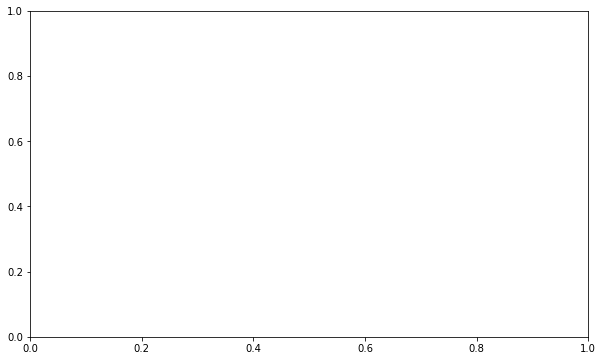

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the topics of interest
topics_of_interest = [
    'Topic 2: In-Flight Experience',
    'Topic 8: Seating and Classes',
    'Topic 5: Ticketing and Booking',
    'Topic 6: Customer Service and Refunds',
    'Topic 10: Flight Delays and Cancellations',
    'Topic 1: Luggage and Baggage Check',
    'Topic 7: Boarding and Time Management',
    'Topic 9: Staff Behavior and Travel Experience',
    'Topic 3: Airline Experience',
    'Topic 0: Rest Topic',
    'Topic 4: Assistance at the Airport'
]

# Filter the data DataFrame to include only the topics of interest
filtered_data = data[data['topic_name'].isin(topics_of_interest)]

# Extract year and month from the 'date_flown' column
filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
filtered_data['month_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.month

# Define a function to map month to half-year
def map_to_half_year(month):
    if month <= 6:
        return '1st Half'
    else:
        return '2nd Half'

# Map the month to half-year
filtered_data['half_year'] = filtered_data['month_flown'].map(map_to_half_year)

# Group the filtered data by 'year_flown', 'half_year', and calculate the average compound score for each group
grouped_data = filtered_data.groupby(['year_flown', 'half_year']).mean()

# Convert the multi-index into formatted strings for year and half-year
grouped_data.index = grouped_data.index.map(lambda x: f"{x[0]}-{x[1]}")

# Create the line plot
fig, ax = plt.subplots(figsize=(10, 6))

for topic in topics_of_interest:
    ax.plot(grouped_data.index, grouped_data[topic], label=topic)

ax.legend()
ax.set_xlabel('Year-Half-Year')
ax.set_ylabel('Average Compound Score')
plt.xticks(rotation=45)
plt.title('Average Compound Score Over Time per Half-Year')
plt.show()




In [13]:
print(data['topic_name'].unique())


['Topic 2: In-Flight Experience' 'Topic 8: Seating and Classes'
 'Topic 5: Ticketing and Booking' 'Topic 6: Customer Service and Refunds'
 'Topic 10: Flight Delays and Cancellations'
 'Topic 1: Luggage and Baggage Check'
 'Topic 7: Boarding and Time Management'
 'Topic 9: Staff Behavior and Travel Experience'
 'Topic 3: Airline Experience' 'Topic 0: Rest Topic'
 'Topic 4: Assistance at the Airport']


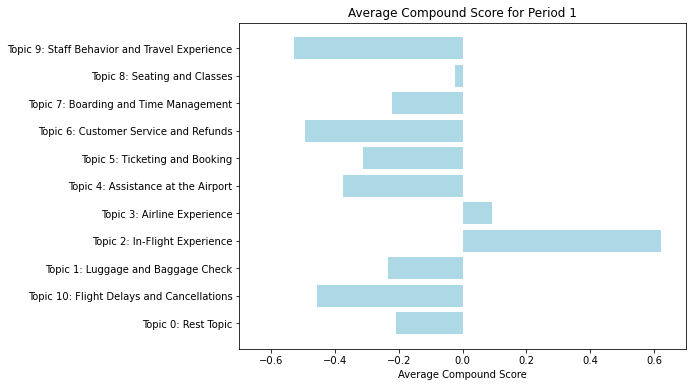

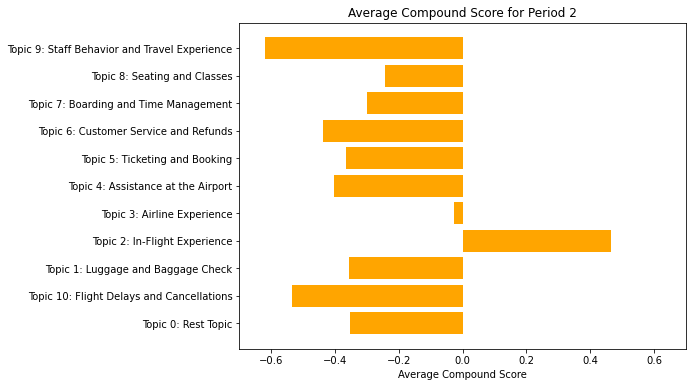

In [64]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the data by 'period' and 'topic_names' and calculate the mean of 'compound_score'
avg_scores = data.groupby(['period', 'topic_name'])['compound_score'].mean().reset_index()

# Filter the data for period 1
period1_scores = avg_scores[avg_scores['period'] == 0]

# Filter the data for period 2
period2_scores = avg_scores[avg_scores['period'] == 1]

# Sort the tables by the 'topic_name' column in ascending order
period1_scores = period1_scores.sort_values('topic_name')
period2_scores = period2_scores.sort_values('topic_name')


# Plot the horizontal bar graph for period 1
fig, ax1 = plt.subplots(figsize=(8, 6))
y_pos1 = range(len(period1_scores))
ax1.barh(y_pos1, period1_scores['compound_score'], align='center', color='lightblue')
ax1.set_yticks(y_pos1)
ax1.set_yticklabels(period1_scores['topic_name'])
ax1.set_xlabel('Average Compound Score')
ax1.set_title('Average Compound Score for Period 1')
ax1.set_xlim(-0.7, 0.7)  # Set the x-axis limits

# Plot the horizontal bar graph for period 2
fig, ax2 = plt.subplots(figsize=(8, 6))
y_pos2 = range(len(period2_scores))
ax2.barh(y_pos2, period2_scores['compound_score'], align='center', color='orange')
ax2.set_yticks(y_pos2)
ax2.set_yticklabels(period2_scores['topic_name'])
ax2.set_xlabel('Average Compound Score')
ax2.set_title('Average Compound Score for Period 2')
ax2.set_xlim(-0.7, 0.7)  # Set the x-axis limits

# Show the plots
plt.show()



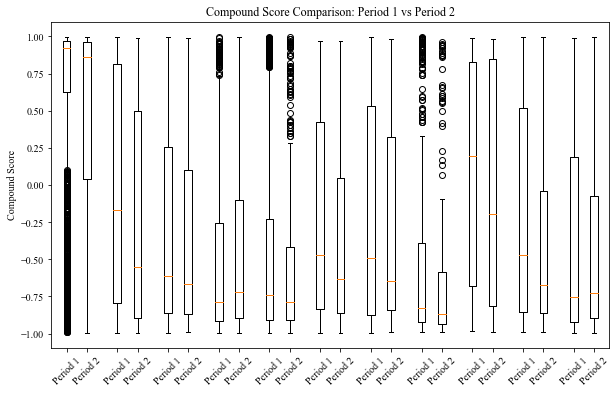

In [87]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the data for Period 1 and Period 2
period1_data = data[data['period'] == 0]
period2_data = data[data['period'] == 1]

# Group the data by 'topic_name' and 'period' and extract the 'compound_score' column
grouped_data = data.groupby(['topic_name', 'period'])['compound_score'].apply(list).reset_index()

# Create a figure and axes for the boxplot
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the topics
topics = data['topic_name'].unique()
for i, topic in enumerate(topics, start=1):
    # Get the compound scores for Period 1 and Period 2 for the current topic
    period1_scores = grouped_data[(grouped_data['topic_name'] == topic) & (grouped_data['period'] == 0)]['compound_score'].values[0]
    period2_scores = grouped_data[(grouped_data['topic_name'] == topic) & (grouped_data['period'] == 1)]['compound_score'].values[0]

    # Create the boxplot for the current topic
    positions = [i - 0.2, i + 0.2]  # Adjust the positions for each boxplot
    ax.boxplot([period1_scores, period2_scores], positions=positions, labels=['Period 1', 'Period 2'])

# Set the y-axis label
ax.set_ylabel('Compound Score')

# Set the title of the plot
ax.set_title('Compound Score Comparison: Period 1 vs Period 2')

# Set the x-axis limits
ax.set_xlim(0.5, len(topics) + 0.5)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()




In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Group the data by topic_name and overall_sentiment and calculate the count
sentiment_counts = data.groupby(['topic_name', 'overall_sentiment']).size().unstack()

# Calculate the total count per topic
total_counts = sentiment_counts.sum(axis=1)

# Calculate the percentage of each sentiment per topic
percentage_positive = (sentiment_counts['Positive'] / total_counts) * 100
percentage_negative = (sentiment_counts['Negative'] / total_counts) * 100
percentage_neutral = (sentiment_counts['Neutral'] / total_counts) * 100

# Get the topics and their indices
topics = sentiment_counts.index
indices = np.arange(len(topics))

# Set the figure size
plt.figure(figsize=(10, 6))

# Set the width of each bar
bar_width = 0.35

# Convert the percentage values to lists
percentage_positive_period1 = percentage_positive[0].values.tolist()
percentage_negative_period1 = percentage_negative[0].values.tolist()
percentage_neutral_period1 = percentage_neutral[0].values.tolist()

percentage_positive_period2 = percentage_positive[1].values.tolist()
percentage_negative_period2 = percentage_negative[1].values.tolist()
percentage_neutral_period2 = percentage_neutral[1].values.tolist()

# Plot the bar chart for Period 1
for i, topic in enumerate(topics):
    plt.bar(indices[i] - bar_width/2, percentage_positive_period1[i], width=bar_width/3, label='Positive', color='lightgreen')
    plt.bar(indices[i] - bar_width/2, percentage_negative_period1[i], width=bar_width/3, bottom=percentage_positive_period1[i], label='Negative', color='red')
    plt.bar(indices[i] - bar_width/2, percentage_neutral_period1[i], width=bar_width/3, bottom=percentage_positive_period1[i] + percentage_negative_period1[i], label='Neutral', color='gray')

# Plot the bar chart for Period 2
for i, topic in enumerate(topics):
    plt.bar(indices[i] + bar_width/2, percentage_positive_period2[i], width=bar_width/3, label='Positive', color='lightgreen', alpha=0.5)
    plt.bar(indices[i] + bar_width/2, percentage_negative_period2[i], width=bar_width/3, bottom=percentage_positive_period2[i], label='Negative', color='red', alpha=0.5)
    plt.bar(indices[i] + bar_width/2, percentage_neutral_period2[i], width=bar_width/3, bottom=percentage_positive_period2[i] + percentage_negative_period2[i], label='Neutral', color='gray', alpha=0.5)

# Set the x-axis ticks and labels
plt.xticks(indices, topics, rotation=90)

# Set the plot title and axes labels
plt.title('Percentage of Reviews by Sentiment for Each Topic')
plt.xlabel('Topic')
plt.ylabel('Percentage')

# Add a legend
plt.legend()

# Show the plot
plt.show()


AttributeError: 'numpy.float64' object has no attribute 'values'

<Figure size 720x432 with 0 Axes>

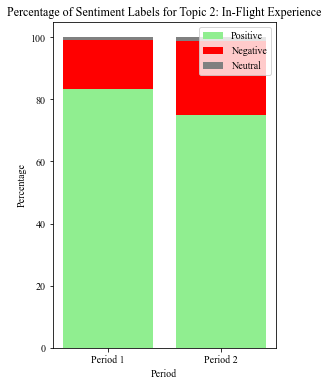

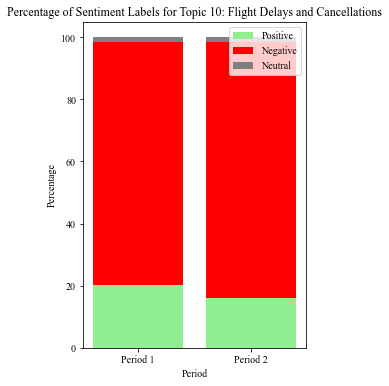

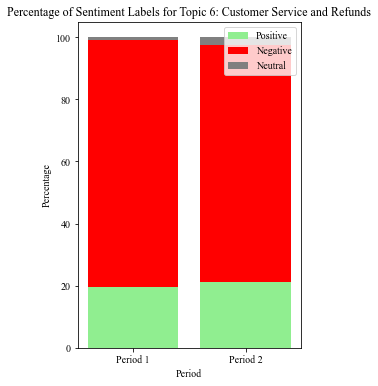

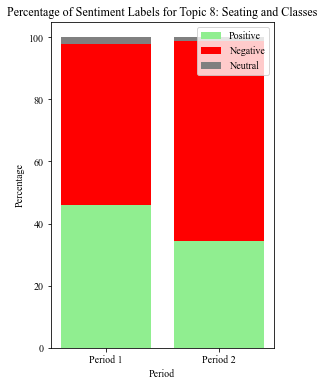

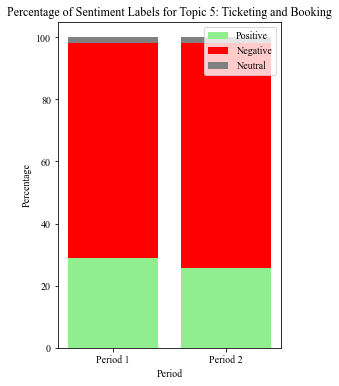

...

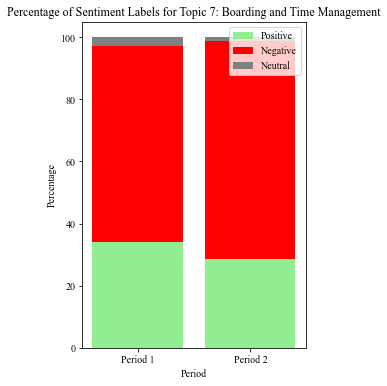

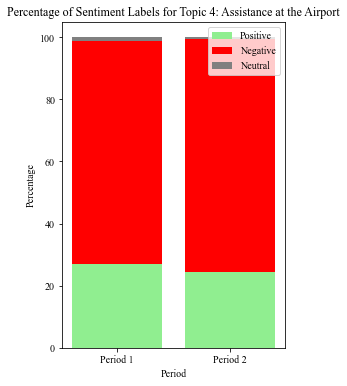

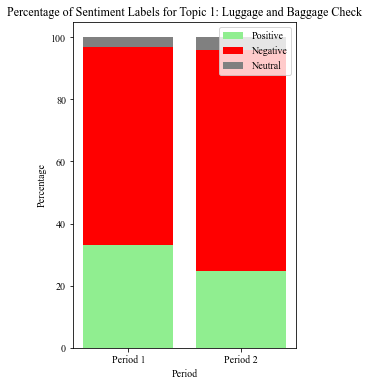

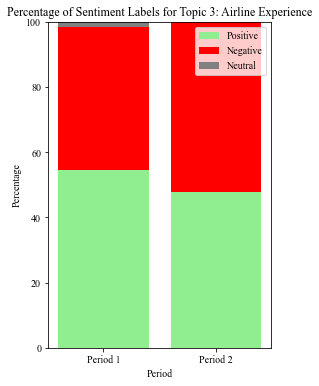

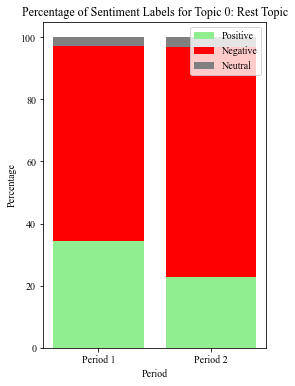

In [109]:
import matplotlib.pyplot as plt

# List of topics
topics = [
    'Topic 2: In-Flight Experience',
    'Topic 10: Flight Delays and Cancellations',
    'Topic 6: Customer Service and Refunds',
    'Topic 8: Seating and Classes',
    'Topic 5: Ticketing and Booking',
    'Topic 9: Staff Behavior and Travel Experience',
    'Topic 7: Boarding and Time Management',
    'Topic 4: Assistance at the Airport',
    'Topic 1: Luggage and Baggage Check',
    'Topic 3: Airline Experience',
    'Topic 0: Rest Topic'
]

# Iterate over each topic
for topic in topics:
    # Filter the data for the current topic
    topic_data = data[data['topic_name'] == topic]

    # Group the filtered data by period and overall sentiment and calculate the count
    sentiment_counts = topic_data.groupby(['period', 'overall_sentiment']).size().unstack()

    # Calculate the total count per period
    total_counts = sentiment_counts.sum(axis=1)

    # Calculate the percentage of each sentiment per period
    percentage_positive = (sentiment_counts['Positive'] / total_counts) * 100
    percentage_negative = (sentiment_counts['Negative'] / total_counts) * 100
    percentage_neutral = (sentiment_counts['Neutral'] / total_counts) * 100

    # Set the figure size
    plt.figure(figsize=(4, 6))

    # Set the positions of the bars on the x-axis
    bar_positions = [1, 2]

    # Plot the bars for each sentiment with stacking
    plt.bar(bar_positions, percentage_positive, label='Positive', color='lightgreen')
    plt.bar(bar_positions, percentage_negative, bottom=percentage_positive, label='Negative', color='red')
    plt.bar(bar_positions, percentage_neutral, bottom=percentage_positive + percentage_negative, label='Neutral', color='gray')

    # Set the x-axis ticks and labels
    plt.xticks(bar_positions, ['Period 1', 'Period 2'])
    plt.xlabel('Period')
    plt.ylabel('Percentage')

    # Set the plot title
    plt.title(f'Percentage of Sentiment Labels for {topic}')

    # Add a legend to the right on the top
    plt.legend(loc='upper right')

    # Show the plot
    plt.show()


ValueError: The number of FixedLocator locations (3), usually from a call to set_ticks, does not match the number of ticklabels (22).

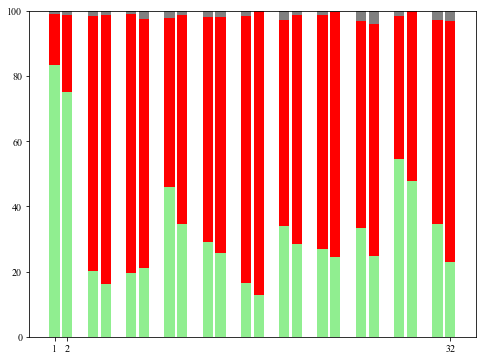

In [106]:
import matplotlib.pyplot as plt

# List of topics
topics = [
    'Topic 2: In-Flight Experience',
    'Topic 10: Flight Delays and Cancellations',
    'Topic 6: Customer Service and Refunds',
    'Topic 8: Seating and Classes',
    'Topic 5: Ticketing and Booking',
    'Topic 9: Staff Behavior and Travel Experience',
    'Topic 7: Boarding and Time Management',
    'Topic 4: Assistance at the Airport',
    'Topic 1: Luggage and Baggage Check',
    'Topic 3: Airline Experience',
    'Topic 0: Rest Topic'
]

# Set the figure size
plt.figure(figsize=(8, 6))

# Set the positions of the bars on the x-axis
bar_positions = [1, 2]

# Iterate over each topic
for i, topic in enumerate(topics):
    # Filter the data for the current topic
    topic_data = data[data['topic_name'] == topic]

    # Group the filtered data by period and overall sentiment and calculate the count
    sentiment_counts = topic_data.groupby(['period', 'overall_sentiment']).size().unstack()

    # Calculate the total count per period
    total_counts = sentiment_counts.sum(axis=1)

    # Calculate the percentage of each sentiment per period
    percentage_positive = (sentiment_counts['Positive'] / total_counts) * 100
    percentage_negative = (sentiment_counts['Negative'] / total_counts) * 100
    percentage_neutral = (sentiment_counts['Neutral'] / total_counts) * 100

    # Plot the bars for each sentiment with stacking
    plt.bar(bar_positions, percentage_positive, label='Positive', color='lightgreen')
    plt.bar(bar_positions, percentage_negative, bottom=percentage_positive, label='Negative', color='red')
    plt.bar(bar_positions, percentage_neutral, bottom=percentage_positive + percentage_negative, label='Neutral', color='gray')

    # Shift the positions for the next topic
    bar_positions = [p + 3 for p in bar_positions]

# Set the x-axis ticks and labels
plt.xticks([1, 2, 3*len(topics)-1], ['Period 1', 'Period 2'] * len(topics))
plt.xlabel('Period')
plt.ylabel('Percentage')

# Set the plot title
plt.title('Percentage of Sentiment Labels for Each Topic')

# Add a legend to the right on the top
plt.legend(loc='upper right')

# Show the plot
plt.show()


## Changepoint analysis

Topic 3 

In [22]:
import pandas as pd

data['date_flown'] = pd.to_datetime(data['date_flown'], errors='coerce')

# Filter the dataset to select the specified period
start_date = pd.to_datetime('2017-01-01')
end_date = pd.to_datetime('2022-12-31')
topic_name = 'Topic 3: Airline Experience'
filtered_data = data[(data['date_flown'] >= start_date) & (data['date_flown'] <= end_date)]
filtered_data_topic3 = data[(data['topic_name'] == topic_name)]

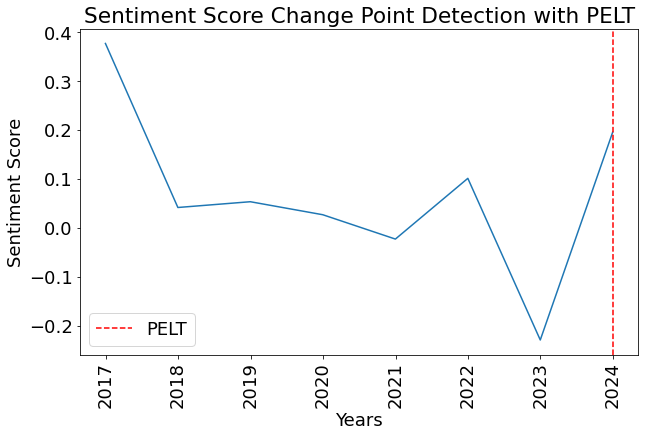

In [35]:
import numpy as np
import pandas as pd
import ruptures as rpt
import matplotlib
import matplotlib.pyplot as plt

# Extract the sentiment scores and corresponding month values from the DataFrame
data = filtered_data_topic3['compound_score'].values
months = pd.to_datetime(filtered_data_topic3['date_flown'])

# Create a Pandas Series with sentiment scores and month values
series = pd.Series(data=data, index=months)

# Resample the series to monthly frequency
series_monthly = series.resample('Y').mean()

# PELT (Pruned Exact Linear Time)
penalty = 5  # Adjust the penalty value
algo_pelt = rpt.Pelt(model="rbf").fit(series_monthly.values[:, np.newaxis])
result_pelt = algo_pelt.predict(pen=penalty)

# Visualize the change points
plt.figure(figsize=(10, 6))
plt.plot(series_monthly.index, series_monthly.values)
plt.title("Sentiment Score Change Point Detection with PELT")
plt.xlabel("Years")
plt.ylabel("Sentiment Score")
matplotlib.rcParams.update({'font.size': 18})


# Plot vertical lines for the detected change points (PELT)
for cp in result_pelt:
    plt.axvline(x=series_monthly.index[cp-1], color='red', linestyle='--', label='PELT')

plt.xticks(rotation=90)
plt.legend()
plt.show()

In [26]:
data = pd.read_csv('topic_modelling_data.csv')

In [27]:
import pandas as pd

data['date_flown'] = pd.to_datetime(data['date_flown'], errors='coerce')

# Filter the dataset to select the specified period
start_date = pd.to_datetime('2017-01-01')
end_date = pd.to_datetime('2022-12-31')
topic_name = 'Topic 8: Seating and Classes'
filtered_data = data[(data['date_flown'] >= start_date) & (data['date_flown'] <= end_date)]
filtered_data_topic8 = data[(data['topic_name'] == topic_name)]

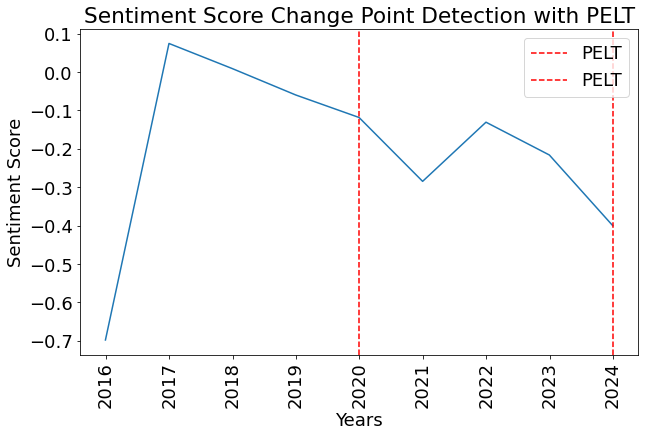

In [34]:
import numpy as np
import pandas as pd
import ruptures as rpt
import matplotlib
import matplotlib.pyplot as plt

# Extract the sentiment scores and corresponding month values from the DataFrame
data = filtered_data_topic8['compound_score'].values
months = pd.to_datetime(filtered_data_topic8['date_flown'])

# Create a Pandas Series with sentiment scores and month values
series = pd.Series(data=data, index=months)

# Resample the series to monthly frequency
series_monthly = series.resample('Y').mean()

# PELT (Pruned Exact Linear Time)
penalty = 1  # Adjust the penalty value
algo_pelt = rpt.Pelt(model="rbf").fit(series_monthly.values[:, np.newaxis])
result_pelt = algo_pelt.predict(pen=penalty)

# Visualize the change points
plt.figure(figsize=(10, 6))
plt.plot(series_monthly.index, series_monthly.values)
plt.title("Sentiment Score Change Point Detection with PELT")
plt.xlabel("Years")
plt.ylabel("Sentiment Score")
matplotlib.rcParams.update({'font.size': 18})


# Plot vertical lines for the detected change points (PELT)
for cp in result_pelt:
    plt.axvline(x=series_monthly.index[cp-1], color='red', linestyle='--', label='PELT')

plt.xticks(rotation=90)
plt.legend()
plt.show()

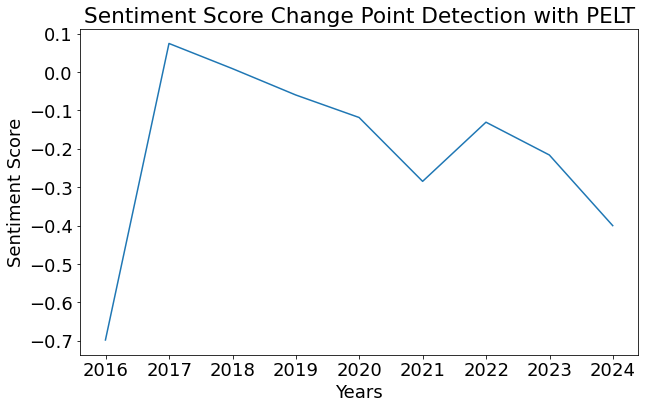

In [33]:
# Extract the sentiment scores and corresponding month values from the DataFrame
data = filtered_data_topic8['compound_score'].values
months = pd.to_datetime(filtered_data_topic8['date_flown'])

# Create a Pandas Series with sentiment scores and month values
series = pd.Series(data=data, index=months)

# Resample the series to monthly frequency
series_monthly = series.resample('Y').mean()

# Visualize the change points
plt.figure(figsize=(10, 6))
plt.plot(series_monthly.index, series_monthly.values)
plt.title("Sentiment Score Change Point Detection with PELT")
plt.xlabel("Years")
plt.ylabel("Sentiment Score")
matplotlib.rcParams.update({'font.size': 18})

## Cabin Flown

In [40]:
data = pd.read_csv('topic_modelling_data.csv')

In [41]:
row_counts = data['cabin_flown'].value_counts()
print(row_counts)

Economy Class      9770
Business Class     2131
Premium Economy     576
First Class         161
Name: cabin_flown, dtype: int64


## Type of Traveller

In [42]:
data.head(5)

,airline,ratingValue,author,country,reviewText,verified,type_of_traveller,cabin_flown,date_flown,seat_comfort,...,continent,reviewText_char_count,period,processed_review,compound_score,overall_sentiment,sentiment_scores,dominant_topic,year_month,topic_name
0,TAP Portugal,7,594f7ce5800c4faff13c0518221598fafc95fe7822c1d9...,United Kingdom,Used TAP from LGW as no direct flight from Hea...,True,Couple Leisure,Business Class,2023-05-01,3.0,...,Europe,1007,1,Used TAP from LGW as no direct flight from Hea...,0.9436,Positive,"{'neg': 0.059, 'neu': 0.792, 'pos': 0.149, 'co...",2,2023-05,Topic 2: In-Flight Experience
1,TAP Portugal,1,aced8334e429b631298259865985f84fedeb92b8e78e98...,Belgium,There were enough counters to check in for bus...,True,Business,Business Class,2023-05-01,1.0,...,Europe,747,1,There were enough counters to check in for bus...,-0.9771,Negative,"{'neg': 0.194, 'neu': 0.762, 'pos': 0.044, 'co...",8,2023-05,Topic 8: Seating and Classes
2,TAP Portugal,1,d16285a68ac162b25216d8ed7470985fc6ce8c4682edf2...,United States,I have never encountered such incompetency. Wh...,True,Solo Leisure,Economy Class,2023-05-01,1.0,...,North America,855,1,I have never encountered such incompetency. Wh...,-0.9735,Negative,"{'neg': 0.163, 'neu': 0.824, 'pos': 0.013, 'co...",5,2023-05,Topic 5: Ticketing and Booking
3,TAP Portugal,4,f9e3269773ef1a6724344b180c05776345006cfb8d89f1...,Portugal,The flight was in the morning and on time. The...,True,Business,Economy Class,2023-05-01,1.0,...,Europe,262,1,The flight was in the morning and on time. The...,0.0398,Neutral,"{'neg': 0.117, 'neu': 0.746, 'pos': 0.137, 'co...",2,2023-05,Topic 2: In-Flight Experience
4,TAP Portugal,1,625c592ca227e3251c6538be78698192dc23133f37e052...,Portugal,The flight was cancelled 1hr before departure....,True,Family Leisure,Economy Class,2022-10-01,1.0,...,Europe,329,1,The flight was cancelled 1hr before departure....,-0.7645,Negative,"{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'comp...",6,2022-10,Topic 6: Customer Service and Refunds


In [46]:
# Filter the data
before_covid = data[(data['year_flown'] >= 2017) & (data['year_flown'] <= 2019)]
during_after_covid = data[(data['year_flown'] >= 2020) & (data['year_flown'] <= 2022)]

# Add a column indicating before or during COVID
before_covid = before_covid.assign(before_during_covid=0)
during_after_covid = during_after_covid.assign(before_during_covid=1)

# Concatenate
data = pd.concat([before_covid, during_after_covid])
data = data.reset_index(drop=True)

data.head(5)

,airline,ratingValue,author,country,reviewText,verified,type_of_traveller,cabin_flown,date_flown,seat_comfort,...,reviewText_char_count,period,processed_review,compound_score,overall_sentiment,sentiment_scores,dominant_topic,year_month,topic_name,before_during_covid
0,TAP Portugal,3,9f61d6058d5edd3a0fa2313782b1e1cd41a5f2e1f79d71...,United States,Purchased the tickets December 2019. Airline n...,True,Couple Leisure,Economy Class,2019-08-01,NaN,...,659,0,Purchased the tickets December 2019. Airline n...,-0.8038,Negative,"{'neg': 0.098, 'neu': 0.882, 'pos': 0.021, 'co...",6,2019-08,Topic 6: Customer Service and Refunds,0
1,TAP Portugal,2,4f7a4ff61bf17f3e171b519e935f3085201bb7ea57618f...,United States,"When you fly with TAP, cross your fingers and ...",True,Solo Leisure,Economy Class,2019-10-01,2.0,...,284,0,"When you fly with TAP, cross your fingers and ...",0.2942,Positive,"{'neg': 0.055, 'neu': 0.851, 'pos': 0.094, 'co...",3,2019-10,Topic 3: Airline Experience,0
2,TAP Portugal,10,b892bffb2c1032d4c5c0b037e65aa5197a62fc8ae31314...,United Kingdom,London Heathrow to Faro via Lisbon. One of my ...,True,Family Leisure,Economy Class,2019-07-01,5.0,...,520,0,London Heathrow to Faro via Lisbon. One of my ...,0.8896,Positive,"{'neg': 0.067, 'neu': 0.786, 'pos': 0.148, 'co...",2,2019-07,Topic 2: In-Flight Experience,0
3,TAP Portugal,1,23304178961e9c4738f20e49226d9a8ce650f0b800dca9...,United Kingdom,Miami to London via Lisbon. Have called and em...,True,Solo Leisure,Economy Class,2019-06-01,1.0,...,306,0,Miami to London via Lisbon. Have called and em...,-0.6381,Negative,"{'neg': 0.132, 'neu': 0.827, 'pos': 0.04, 'com...",6,2019-06,Topic 6: Customer Service and Refunds,0
4,TAP Portugal,1,8d49e100abe5d4c9c6d2ba9c8727d31d254be39e7096c3...,Sweden,19 Dec 2019 me and my wife had a business clas...,True,Couple Leisure,Business Class,2019-12-01,2.0,...,1718,0,19 Dec 2019 me and my wife had a business clas...,-0.8843,Negative,"{'neg': 0.061, 'neu': 0.915, 'pos': 0.024, 'co...",10,2019-12,Topic 10: Flight Delays and Cancellations,0


In [47]:
row_counts = data['type_of_traveller'].value_counts()
print(row_counts)


Solo Leisure      4109
Couple Leisure    2968
Business          1981
Family Leisure    1734
Name: type_of_traveller, dtype: int64


In [48]:
average_values = round(data.groupby(['before_during_covid', 'type_of_traveller']).mean(), 1)
latex_table = average_values.to_latex()
average_values

C:\Users\70608ebe\AppData\Local\Temp\ipykernel_20428\154306383.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_table = average_values.to_latex()


ratingValue  verified  seat_comfort  \
before_during_covid type_of_traveller                                        
0                   Business                   4.1       1.0           2.7   
                    Couple Leisure             3.9       1.0           2.5   
                    Family Leisure             3.8       1.0           2.6   
                    Solo Leisure               4.6       1.0           2.8   
1                   Business                   3.1       1.0           2.5   
                    Couple Leisure             3.1       1.0           2.4   
                    Family Leisure             2.5       1.0           2.3   
                    Solo Leisure               3.2       1.0           2.6   

                                       cabin_staff_service  \
before_during_covid type_of_traveller                        
0                   Business                           3.0   
                    Couple Leisure                     2.9   
                    Family Leisure                     2.9   
                    Solo Leisure                       3.1   
1                   Business                           2.7   
                    Couple Leisure                     2.7   
                    Family Leisure                     2.6   
                    Solo Leisure                       2.7   

                                       food_and_beverages  ground_service  \
before_during_covid type_of_traveller                                       
0                   Business                          2.6             2.5   
                    Couple Leisure                    2.6             2.4   
                    Family Leisure                    2.6             2.4   
                    Solo Leisure                      2.9             2.6   
1                   Business                          2.3             2.1   
                    Couple Leisure                    2.4             2.1   
                    Family Leisure                    2.3             1.9   
                    Solo Leisure                      2.5             2.2   

                                       value_for_money  \
before_during_covid type_of_traveller                    
0                   Business                       2.4   
                    Couple Leisure                 2.5   
                    Family Leisure                 2.4   
                    Solo Leisure                   2.8   
1                   Business                       2.0   
                    Couple Leisure                 2.1   
                    Family Leisure                 1.9   
                    Solo Leisure                   2.1   

                                       inflight_entertainment  \
before_during_covid type_of_traveller                           
0                   Business                              2.5   
                    Couple Leisure                        2.7   
                    Family Leisure                        2.8   
                    Solo Leisure                          2.8   
1                   Business                              2.5   
                    Couple Leisure                        2.4   
                    Family Leisure                        2.4   
                    Solo Leisure                          2.5   

                                       wifi_and_connectivity  is_english  \
before_during_covid type_of_traveller                                      
0                   Business                             2.2         1.0   
                    Couple Leisure                       2.0         1.0   
                    Family Leisure                       2.1         1.0   
                    Solo Leisure                         2.1         1.0   
1                   Business                             2.2         1.0   
                    Couple Leisure                       1.9         1.0   
                    Family

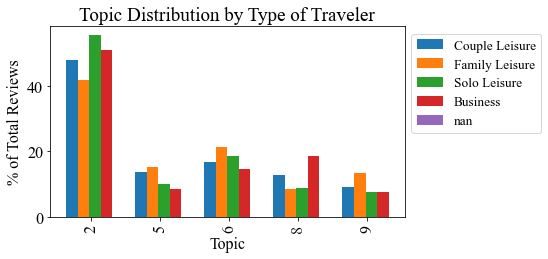

In [63]:
import numpy as np
import matplotlib.pyplot as plt

# Filter out topic 0
filtered_data = data[data['dominant_topic'].isin([2, 5, 6, 8, 9])]

# Get the unique types of travelers
type_of_travelers = filtered_data['type_of_traveller'].unique()

# Calculate the topic distribution for each type of traveler
topic_distributions = []
for traveler_type in type_of_travelers:
    # Filter the data for the specific type of traveler
    traveler_data = filtered_data[filtered_data['type_of_traveller'] == traveler_type]
    
    # Calculate the topic distribution
    topic_distribution = traveler_data['dominant_topic'].value_counts(normalize=True) * 100
    
    topic_distributions.append(topic_distribution)

# Get the topic indices and sort them
topic_indices = [2, 5, 6, 8, 9]

# Set the width of each bar
bar_width = 0.2

# Set the x positions for the bars
x = np.arange(len(topic_indices)) * (len(type_of_travelers) + 1) * bar_width

# Sort the topic distributions based on the topic indices
sorted_topic_distributions = [topic_distributions[i].reindex(topic_indices) for i in range(len(topic_distributions))]

# Plot the bars for each type of traveler
plt.figure()
for i, traveler_type in enumerate(type_of_travelers):
    plt.bar(x + (i * bar_width), sorted_topic_distributions[i], width=bar_width, label=traveler_type)

# Add labels, title, and legend
plt.xlabel('Topic')
plt.ylabel('% of Total Reviews')
plt.title('Topic Distribution by Type of Traveler')
plt.xticks(x + (len(type_of_travelers) / 3) * bar_width, topic_indices)
plt.legend(title='Type of Traveler')

# Adjust the layout to prevent overlapping of labels
plt.tight_layout()

# Show the plot
plt.xticks(rotation=90)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.7), fontsize='small')
plt.show()


In [93]:
# Group the dataset by 'type_of_traveller' column
grouped = data.groupby('type_of_traveller')

# Iterate over each group
for group_name, group_df in grouped:
    print(f"Type of Traveller: {group_name}")
    
    # Count the frequency of each dominant topic in the group
    topic_counts = group_df['dominant_topic'].value_counts()
    
    # Select the top 4 dominant topics
    top_topics = topic_counts.head(5)
    
    # Calculate the total count within the group
    total_count = topic_counts.sum()
    
    # Calculate and print the relative count for each top topic
    for topic, count in top_topics.items():
        relative_count = count / total_count
        print(f"Topic: {topic}, Relative Count: {relative_count:.2%}")
    
    print('\n')  # Add a line break between groups


Type of Traveller: Business
Topic: 2, Relative Count: 34.12%
Topic: 10, Relative Count: 14.03%
Topic: 8, Relative Count: 12.42%
Topic: 6, Relative Count: 9.79%
Topic: 7, Relative Count: 5.96%


Type of Traveller: Couple Leisure
Topic: 2, Relative Count: 30.59%
Topic: 10, Relative Count: 15.16%
Topic: 6, Relative Count: 10.71%
Topic: 5, Relative Count: 8.73%
Topic: 8, Relative Count: 8.19%


Type of Traveller: Family Leisure
Topic: 2, Relative Count: 26.36%
Topic: 10, Relative Count: 15.17%
Topic: 6, Relative Count: 13.38%
Topic: 5, Relative Count: 9.52%
Topic: 9, Relative Count: 8.36%


Type of Traveller: Solo Leisure
Topic: 2, Relative Count: 36.43%
Topic: 10, Relative Count: 15.04%
Topic: 6, Relative Count: 12.12%
Topic: 5, Relative Count: 6.64%
Topic: 8, Relative Count: 5.72%




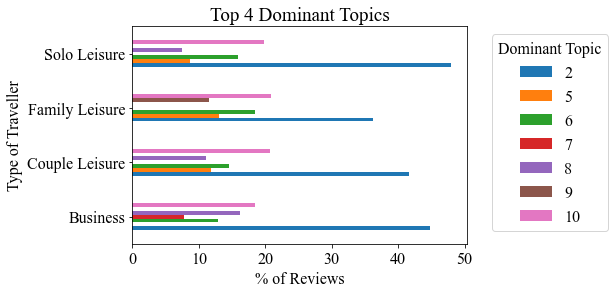

In [92]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the dataset by 'type_of_traveller' column
grouped = data.groupby('type_of_traveller')

# Create an empty dictionary to store the top topics for each group
top_topics_dict = {}

# Iterate over each group
for group_name, group_df in grouped:
    # Count the frequency of each dominant topic in the group
    topic_counts = group_df['dominant_topic'].value_counts()
    
    # Select the top 4 dominant topics
    top_topics = topic_counts.head(5)
    
    # Calculate the total count within the group
    total_count = top_topics.sum()
    
    # Calculate the percentages
    percentages = top_topics / total_count * 100
    
    # Store the percentages in the dictionary
    top_topics_dict[group_name] = percentages

# Create a DataFrame from the dictionary
top_topics_df = pd.DataFrame(top_topics_dict)

# Create the horizontal bar plot
top_topics_df.T.plot(kind='barh')
plt.ylabel('Type of Traveller')
plt.xlabel('% of Reviews')
plt.title('Top 4 Dominant Topics')
plt.legend(title='Dominant Topic', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



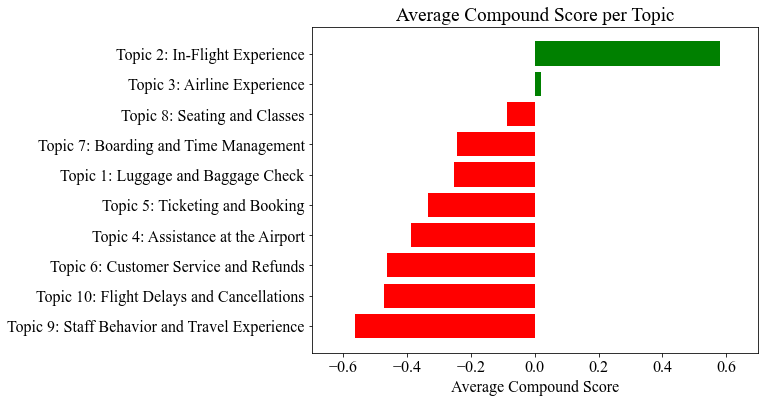

In [102]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter out topic 0 from the dataset
filtered_data = data[data['topic_name'] != "Topic 0: Rest Topic"]

# Group the filtered data by 'topic_name' and calculate the mean of 'compound_score'
avg_scores = filtered_data.groupby('topic_name')['compound_score'].mean().reset_index()

# Sort the table by the 'compound_score' column in descending order
avg_scores = avg_scores.sort_values('compound_score', ascending=True)

# Create a list of colors based on the sign of the compound score
colors = ['red' if score < 0 else 'green' for score in avg_scores['compound_score']]

# Plot the horizontal bar graph with colored bars
fig, ax = plt.subplots(figsize=(8, 6))
y_pos = range(len(avg_scores))
ax.barh(y_pos, avg_scores['compound_score'], align='center', color=colors)
ax.set_yticks(y_pos)
ax.set_yticklabels(avg_scores['topic_name'])
ax.set_xlabel('Average Compound Score')
ax.set_title('Average Compound Score per Topic')
ax.set_xlim(-0.7, 0.7)  # Set the x-axis limits

# Show the plot
plt.show()


In [103]:
avg_scores

,topic_name,compound_score
9,Topic 9: Staff Behavior and Travel Experience,-0.563988
0,Topic 10: Flight Delays and Cancellations,-0.473852
6,Topic 6: Customer Service and Refunds,-0.462396
4,Topic 4: Assistance at the Airport,-0.389202
5,Topic 5: Ticketing and Booking,-0.336246
1,Topic 1: Luggage and Baggage Check,-0.253595
7,Topic 7: Boarding and Time Management,-0.243390
8,Topic 8: Seating and Classes,-0.087937
3,Topic 3: Airline Experience,0.018029
2,Topic 2: In-Flight Experience,0.581830


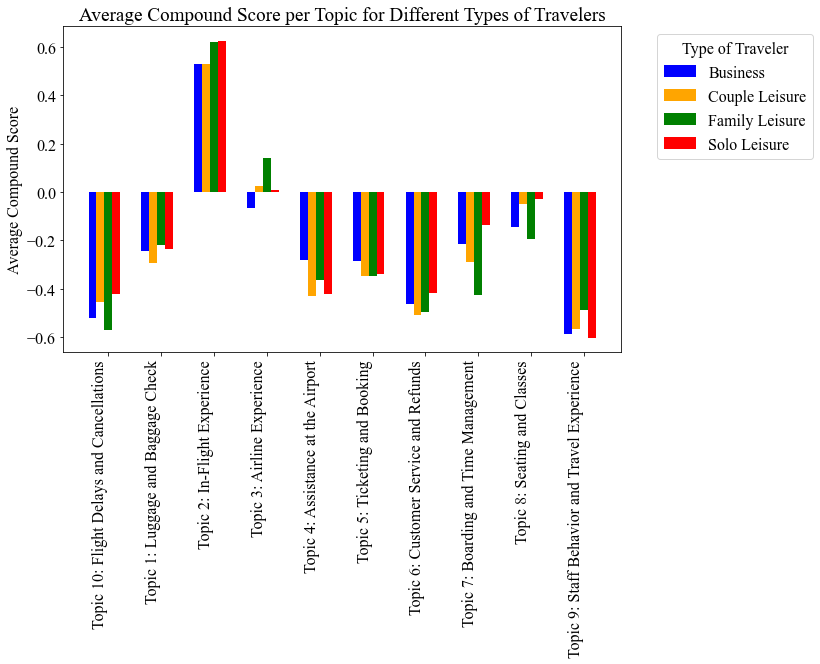

In [113]:
data = data[data['topic_name'] != "Topic 0: Rest Topic"]

# Group the data by 'topic_name' and 'type_of_traveller' and calculate the mean of 'compound_score'
avg_scores = data.groupby(['topic_name', 'type_of_traveller'])['compound_score'].mean().reset_index()

# Get the unique topics and types of travelers
topics = avg_scores['topic_name'].unique()
traveler_types = avg_scores['type_of_traveller'].unique()

# Set the width of each bar
bar_width = 0.15

# Set the x-axis positions for the bars
x_positions = np.arange(len(topics))

# Create a color map for different types of travelers
color_map = {
    'Business': 'blue',
    'Couple Leisure': 'orange',
    'Family Leisure': 'green',
    'Solo Leisure': 'red'
}

# Create the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each type of traveler
for i, traveler_type in enumerate(traveler_types):
    # Get the average compound scores for the current traveler type
    traveler_scores = avg_scores[avg_scores['type_of_traveller'] == traveler_type]['compound_score']
    
    # Calculate the x-axis positions for the bars of the current traveler type
    traveler_x_positions = x_positions + (i * bar_width) - (len(traveler_types) * bar_width) / 2
    
    # Plot the bars for the current traveler type
    ax.bar(traveler_x_positions, traveler_scores, width=bar_width, label=traveler_type, align='center',
           color=color_map[traveler_type])

# Set the x-axis tick positions and labels
ax.set_xticks(x_positions)
ax.set_xticklabels(topics, rotation=45, ha='right')

# Set the y-axis label
ax.set_ylabel('Average Compound Score')

# Set the chart title
ax.set_title('Average Compound Score per Topic for Different Types of Travelers')

# Add a legend
ax.legend(title='Type of Traveler')

# Display the chart
plt.legend(title='Type of Traveler', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.show()


In [114]:
# Pivot the data to create a table with topics as columns and types of travelers as rows
table = pd.pivot_table(data, values='compound_score', index='type_of_traveller', columns='topic_name', aggfunc='mean')

# Round the values in the table to two decimal places
table = table.round(3)

# Display the table
print(table)


topic_name         Topic 10: Flight Delays and Cancellations  \
type_of_traveller                                              
Business                                              -0.520   
Couple Leisure                                        -0.457   
Family Leisure                                        -0.573   
Solo Leisure                                          -0.423   

topic_name         Topic 1: Luggage and Baggage Check  \
type_of_traveller                                       
Business                                       -0.246   
Couple Leisure                                 -0.296   
Family Leisure                                 -0.221   
Solo Leisure                                   -0.236   

topic_name         Topic 2: In-Flight Experience  Topic 3: Airline Experience  \
type_of_traveller                                                               
Business                                   0.532                       -0.064   
Couple Leisure               

KeyError: 'Topic 2: In-Flight Experience'

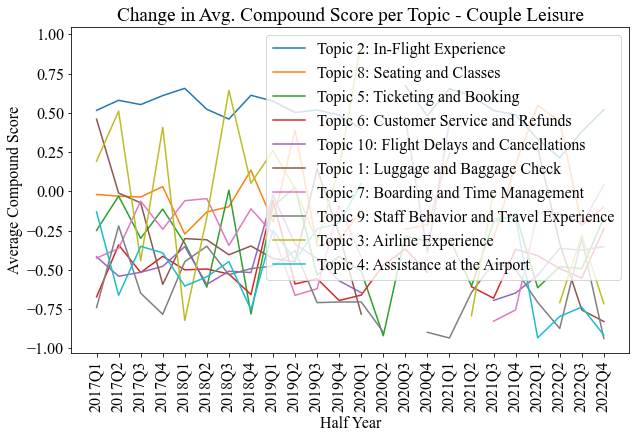

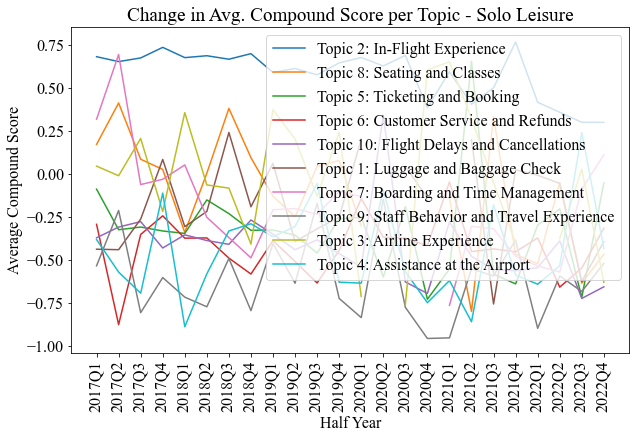

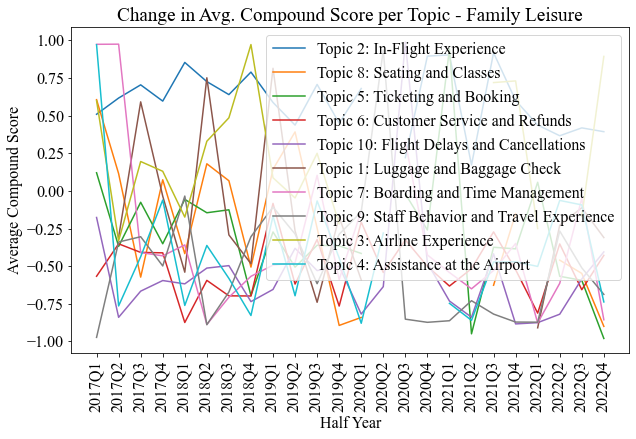

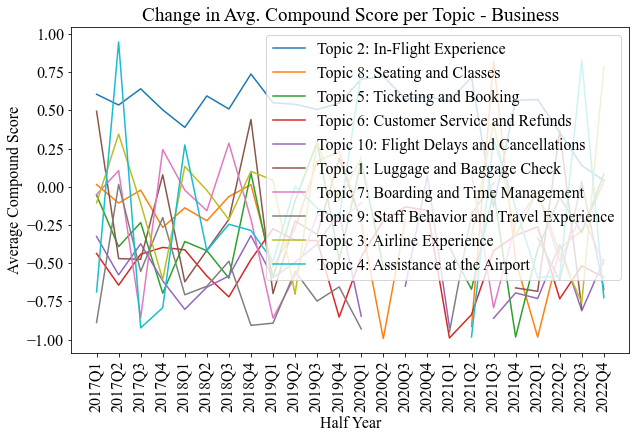

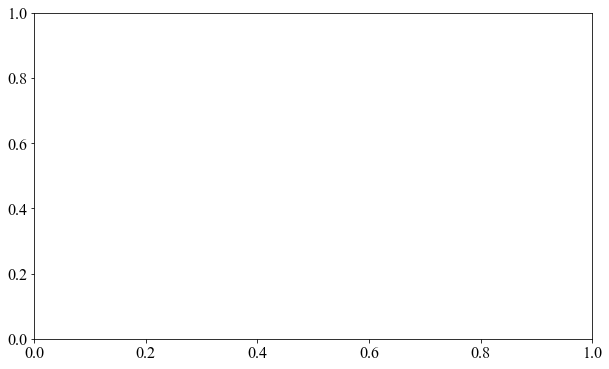

In [122]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the topics of interest
topics_of_interest = [
    'Topic 2: In-Flight Experience',
    'Topic 8: Seating and Classes',
    'Topic 5: Ticketing and Booking',
    'Topic 6: Customer Service and Refunds',
    'Topic 10: Flight Delays and Cancellations',
    'Topic 1: Luggage and Baggage Check',
    'Topic 7: Boarding and Time Management',
    'Topic 9: Staff Behavior and Travel Experience',
    'Topic 3: Airline Experience',
    #'Topic 0: Rest Topic',
    'Topic 4: Assistance at the Airport'
]

# Iterate over each type of traveler
for traveler in data['type_of_traveller'].unique():
    # Filter the data DataFrame for the current type of traveler
    traveler_data = data[data['type_of_traveller'] == traveler]
    
    # Filter the traveler_data DataFrame to include only the topics of interest
    filtered_data = traveler_data[traveler_data['topic_name'].isin(topics_of_interest)]

    # Extract year and month from the 'date_flown' column
    filtered_data['year_flown'] = pd.to_datetime(filtered_data['date_flown']).dt.year
    filtered_data['half_year'] = pd.to_datetime(filtered_data['date_flown']).dt.to_period('Q').astype(str)

    # Group the filtered data by 'half_year', 'topic_name', and calculate the average compound score in each group
    topic_scores = filtered_data.groupby(['half_year', 'topic_name'])['compound_score'].mean().unstack()

    # Reset the index
    topic_scores.reset_index(inplace=True)

    # Plot the data for the current type of traveler
    fig, ax = plt.subplots(figsize=(10, 6))
    x = range(len(topic_scores['half_year']))
    
    for topic in topics_of_interest:
        ax.plot(x, topic_scores[topic], label=topic)

    ax.set_xticks(x)
    ax.set_xticklabels(topic_scores['half_year'], rotation=90)
    ax.set_xlabel('Half Year')
    ax.set_ylabel('Average Compound Score')
    ax.set_title(f'Change in Avg. Compound Score per Topic - {traveler}')
    ax.legend(loc='best')

# Display the plots
plt.tight_layout()
plt.show()

